In [2]:
import sys
import os
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy.signal import savgol_filter

from functools import partial

from matplotlib.colors import LogNorm

In [3]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
plt.rcParams["figure.figsize"] = 8, 5
plt.rcParams["font.size"]      = 11

In [6]:
filename = '/Users/romoluque_c/LEGEND/BACON/datatest/run-11_20_2023-file_1.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

In [10]:
import re

evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

trigger_chs = [9, 10, 11]

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("BACoN_hits_and_times_thr50_md50_run-12_28_2023")]
sorted_files = sorted(filt_files, key=extract_date_and_number)

In [11]:
filt_evts_all                    = {}
idx_peaks_ch_all                 = {}
idx_peaks_thr_ch_all             = {}
height_peaks_ch_all              = {}
height_peaks_sg_ch_all           = {}
height_peaks_deconv_ch_all       = {}
idx_peaks_ch_trigg_all           = {}
idx_peaks_thr_ch_trigg_all       = {}
height_peaks_ch_trigg_all        = {}
height_peaks_sg_ch_trigg_all     = {}
height_peaks_deconv_ch_trigg_all = {}

normal_chs1 = range(9)
normal_chs2 = [0, 1, 2, 3, 4, 6, 7, 8]

for filename in sorted_files:
    my_file    = evts_path+filename
    d          = np.load(my_file, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    if date in ['01_09_2024', '01_10_2024', '01_12_2024', '01_15_2024', '01_17_2024', '01_18_2024', '01_19_2024', '01_22_2024', '01_23_2024', '01_25_2024', '01_29_2024']:
        continue

    if date.startswith("11"):
        normal_chs = normal_chs1
    else:
        normal_chs = normal_chs2
        
    if date not in filt_evts_all:
        print(date)
        filt_evts_all                   [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peaks_ch_all                [date] = {ch: np.concatenate(d['idx_peaks_ch_dict']                .item()[ch]) for ch in normal_chs}
        idx_peaks_thr_ch_all            [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']            .item()[ch]) for ch in normal_chs}
        height_peaks_ch_all             [date] = {ch: np.concatenate(d['height_peaks_ch_dict']             .item()[ch]) for ch in normal_chs}
        height_peaks_sg_ch_all          [date] = {ch: np.concatenate(d['height_peaks_sg_ch_dict']          .item()[ch]) for ch in normal_chs}
        height_peaks_deconv_ch_all      [date] = {ch: np.concatenate(d['height_peaks_deconv_ch_dict']      .item()[ch]) for ch in normal_chs}

        idx_peaks_ch_trigg_all          [date] = {ch: np.concatenate(d['idx_peaks_ch_trigg_dict']          .item()[ch]) for ch in trigger_chs}
        idx_peaks_thr_ch_trigg_all      [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch]) for ch in trigger_chs}
        height_peaks_ch_trigg_all       [date] = {ch: np.concatenate(d['height_peaks_ch_trigg_dict']       .item()[ch]) for ch in trigger_chs}
        height_peaks_sg_ch_trigg_all    [date] = {ch: np.concatenate(d['height_peaks_sg_ch_trigg_dict']    .item()[ch]) for ch in trigger_chs}
        height_peaks_deconv_ch_trigg_all[date] = {ch: np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
        continue

    for ch in normal_chs:
        try:
            filt_evts_all             [date][ch] = np.concatenate((filt_evts_all             [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
            idx_peaks_ch_all          [date][ch] = np.concatenate((idx_peaks_ch_all          [date][ch], np.concatenate(d['idx_peaks_ch_dict']          .item()[ch])))
            idx_peaks_thr_ch_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_all      [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']      .item()[ch])))
            height_peaks_ch_all       [date][ch] = np.concatenate((height_peaks_ch_all       [date][ch], np.concatenate(d['height_peaks_ch_dict']       .item()[ch])))
            height_peaks_sg_ch_all    [date][ch] = np.concatenate((height_peaks_sg_ch_all    [date][ch], np.concatenate(d['height_peaks_sg_ch_dict']    .item()[ch])))
            height_peaks_deconv_ch_all[date][ch] = np.concatenate((height_peaks_deconv_ch_all[date][ch], np.concatenate(d['height_peaks_deconv_ch_dict'].item()[ch])))
        
        except Exception as e:
            print(date, fnum, filename, ch, str(e))
            continue

        for ch in trigger_chs:
            idx_peaks_ch_trigg_all          [date][ch] = np.concatenate((idx_peaks_ch_trigg_all          [date][ch], np.concatenate(d['idx_peaks_ch_trigg_dict']          .item()[ch])))
            idx_peaks_thr_ch_trigg_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_trigg_all      [date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch])))
            height_peaks_ch_trigg_all       [date][ch] = np.concatenate((height_peaks_ch_trigg_all       [date][ch], np.concatenate(d['height_peaks_ch_trigg_dict']       .item()[ch])))
            height_peaks_sg_ch_trigg_all    [date][ch] = np.concatenate((height_peaks_sg_ch_trigg_all    [date][ch], np.concatenate(d['height_peaks_sg_ch_trigg_dict']    .item()[ch])))
            height_peaks_deconv_ch_trigg_all[date][ch] = np.concatenate((height_peaks_deconv_ch_trigg_all[date][ch], np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch])))

12_28_2023


In [9]:
filt_evts_all_xe_dop                    = {}
idx_peaks_ch_all_xe_dop                 = {}
idx_peaks_thr_ch_all_xe_dop             = {}
height_peaks_ch_all_xe_dop              = {}
height_peaks_sg_ch_all_xe_dop           = {}
height_peaks_deconv_ch_all_xe_dop       = {}
idx_peaks_ch_trigg_all_xe_dop           = {}
idx_peaks_thr_ch_trigg_all_xe_dop       = {}
height_peaks_ch_trigg_all_xe_dop        = {}
height_peaks_sg_ch_trigg_all_xe_dop     = {}
height_peaks_deconv_ch_trigg_all_xe_dop = {}
for filename in sorted_files:
    my_file    = evts_path+filename
    d          = np.load(my_file, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    if date in ['01_09_2024', '01_10_2024', '01_12_2024', '01_15_2024', '01_17_2024', '01_18_2024', '01_19_2024', '01_22_2024', '01_23_2024', '01_25_2024', '01_29_2024']:

        normal_chs = [0, 1, 2, 3, 4, 6, 7, 8]    
        
        if date not in filt_evts_all_xe_dop:
            print(date)
            filt_evts_all_xe_dop                   [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
            idx_peaks_ch_all_xe_dop                [date] = {ch: np.concatenate(d['idx_peaks_ch_dict']                .item()[ch]) for ch in normal_chs}
            idx_peaks_thr_ch_all_xe_dop            [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']            .item()[ch]) for ch in normal_chs}
            height_peaks_ch_all_xe_dop             [date] = {ch: np.concatenate(d['height_peaks_ch_dict']             .item()[ch]) for ch in normal_chs}
            height_peaks_sg_ch_all_xe_dop          [date] = {ch: np.concatenate(d['height_peaks_sg_ch_dict']          .item()[ch]) for ch in normal_chs}
            height_peaks_deconv_ch_all_xe_dop      [date] = {ch: np.concatenate(d['height_peaks_deconv_ch_dict']      .item()[ch]) for ch in normal_chs}
    
            idx_peaks_ch_trigg_all_xe_dop          [date] = {ch: np.concatenate(d['idx_peaks_ch_trigg_dict']          .item()[ch]) for ch in trigger_chs}
            idx_peaks_thr_ch_trigg_all_xe_dop      [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch]) for ch in trigger_chs}
            height_peaks_ch_trigg_all_xe_dop       [date] = {ch: np.concatenate(d['height_peaks_ch_trigg_dict']       .item()[ch]) for ch in trigger_chs}
            height_peaks_sg_ch_trigg_all_xe_dop    [date] = {ch: np.concatenate(d['height_peaks_sg_ch_trigg_dict']    .item()[ch]) for ch in trigger_chs}
            height_peaks_deconv_ch_trigg_all_xe_dop[date] = {ch: np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
            continue
    
        for ch in normal_chs:
            try:
                filt_evts_all_xe_dop             [date][ch] = np.concatenate((filt_evts_all_xe_dop             [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peaks_ch_all_xe_dop          [date][ch] = np.concatenate((idx_peaks_ch_all_xe_dop          [date][ch], np.concatenate(d['idx_peaks_ch_dict']          .item()[ch])))
                idx_peaks_thr_ch_all_xe_dop      [date][ch] = np.concatenate((idx_peaks_thr_ch_all_xe_dop      [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']      .item()[ch])))
                height_peaks_ch_all_xe_dop       [date][ch] = np.concatenate((height_peaks_ch_all_xe_dop       [date][ch], np.concatenate(d['height_peaks_ch_dict']       .item()[ch])))
                height_peaks_sg_ch_all_xe_dop    [date][ch] = np.concatenate((height_peaks_sg_ch_all_xe_dop    [date][ch], np.concatenate(d['height_peaks_sg_ch_dict']    .item()[ch])))
                height_peaks_deconv_ch_all_xe_dop[date][ch] = np.concatenate((height_peaks_deconv_ch_all_xe_dop[date][ch], np.concatenate(d['height_peaks_deconv_ch_dict'].item()[ch])))
            except:
                print(date, fnum, filename, ch)
                continue
    
            for ch in trigger_chs:
                idx_peaks_ch_trigg_all_xe_dop          [date][ch] = np.concatenate((idx_peaks_ch_trigg_all_xe_dop          [date][ch], np.concatenate(d['idx_peaks_ch_trigg_dict']          .item()[ch])))
                idx_peaks_thr_ch_trigg_all_xe_dop      [date][ch] = np.concatenate((idx_peaks_thr_ch_trigg_all_xe_dop      [date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch])))
                height_peaks_ch_trigg_all_xe_dop       [date][ch] = np.concatenate((height_peaks_ch_trigg_all_xe_dop       [date][ch], np.concatenate(d['height_peaks_ch_trigg_dict']       .item()[ch])))
                height_peaks_sg_ch_trigg_all_xe_dop    [date][ch] = np.concatenate((height_peaks_sg_ch_trigg_all_xe_dop    [date][ch], np.concatenate(d['height_peaks_sg_ch_trigg_dict']    .item()[ch])))
                height_peaks_deconv_ch_trigg_all_xe_dop[date][ch] = np.concatenate((height_peaks_deconv_ch_trigg_all_xe_dop[date][ch], np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch])))


01_09_2024
01_10_2024
01_12_2024
01_15_2024
01_17_2024
01_18_2024
01_19_2024
01_22_2024
01_23_2024
01_25_2024


In [9]:
#### import re

#### evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

#### normal_chs  = range(9)
#### trigger_chs = [9, 10, 11]

#### filt_evts_all                    = {}
#### idx_peaks_ch_all                 = {}
#### idx_peaks_thr_ch_all             = {}
#### height_peaks_ch_all              = {}
#### height_peaks_sg_ch_all           = {}
#### height_peaks_deconv_ch_all       = {}
#### idx_peaks_ch_trigg_all           = {}
#### idx_peaks_thr_ch_trigg_all       = {}
#### height_peaks_ch_trigg_all        = {}
#### height_peaks_sg_ch_trigg_all     = {}
#### height_peaks_deconv_ch_trigg_all = {}

#### def extract_date_and_number(filename):
####     match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
####     return match.group(1), int(match.group(2))

#### def adapt_evt_id(evt_id, fnum):
####     return 1000000*fnum + np.array(evt_id)

#### files        = os.listdir(evts_path)
#### filt_files   = [file for file in files      if file.startswith("BACoN_hits_and_times_thr50_md50_run-")]
#### sorted_files = sorted(filt_files, key=extract_date_and_number)

#### for filename in sorted_files:
####     my_file    = evts_path+filename
####     d          = np.load(my_file, allow_pickle=True)
####     date, fnum = extract_date_and_number(filename)
####     print(date, fnum)
####         
####     if date not in filt_evts_all:
####         filt_evts_all                   [date] = d['filt_evts_dict']                   .item()
####         idx_peaks_ch_all                [date] = d['idx_peaks_ch_dict']                .item()
####         idx_peaks_thr_ch_all            [date] = d['idx_peaks_thr_ch_dict']            .item()
####         height_peaks_ch_all             [date] = d['height_peaks_ch_dict']             .item()
####         height_peaks_sg_ch_all          [date] = d['height_peaks_sg_ch_dict']          .item()
####         height_peaks_deconv_ch_all      [date] = d['height_peaks_deconv_ch_dict']      .item()
####         idx_peaks_ch_trigg_all          [date] = d['idx_peaks_ch_trigg_dict']          .item()
####         idx_peaks_thr_ch_trigg_all      [date] = d['idx_peaks_thr_ch_trigg_dict']      .item()
####         height_peaks_ch_trigg_all       [date] = d['height_peaks_ch_trigg_dict']       .item()
####         height_peaks_sg_ch_trigg_all    [date] = d['height_peaks_sg_ch_trigg_dict']    .item()
####         height_peaks_deconv_ch_trigg_all[date] = d['height_peaks_deconv_ch_trigg_dict'].item()
####         continue
####     
####     for ch in normal_chs:
####         try:
####             filt_evts_all             [date][ch] = np.concatenate((filt_evts_all             [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
####             idx_peaks_ch_all          [date][ch] = np.concatenate((idx_peaks_ch_all          [date][ch], d['idx_peaks_ch_dict']          .item()[ch]))
####             idx_peaks_thr_ch_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_all      [date][ch], d['idx_peaks_thr_ch_dict']      .item()[ch]))
####             height_peaks_ch_all       [date][ch] = np.concatenate((height_peaks_ch_all       [date][ch], d['height_peaks_ch_dict']       .item()[ch]))
####             height_peaks_sg_ch_all    [date][ch] = np.concatenate((height_peaks_sg_ch_all    [date][ch], d['height_peaks_sg_ch_dict']    .item()[ch]))
####             height_peaks_deconv_ch_all[date][ch] = np.concatenate((height_peaks_deconv_ch_all[date][ch], d['height_peaks_deconv_ch_dict'].item()[ch]))
####         except:
####             print(date, fnum, filename, ch)
####             continue

####         for ch in trigger_chs:
####             idx_peaks_ch_trigg_all          [date][ch] = np.concatenate((idx_peaks_ch_trigg_all          [date][ch], d['idx_peaks_ch_trigg_dict']          .item()[ch]))
####             idx_peaks_thr_ch_trigg_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_trigg_all      [date][ch], d['idx_peaks_thr_ch_trigg_dict']      .item()[ch]))
####             height_peaks_ch_trigg_all       [date][ch] = np.concatenate((height_peaks_ch_trigg_all       [date][ch], d['height_peaks_ch_trigg_dict']       .item()[ch]))
####             height_peaks_sg_ch_trigg_all    [date][ch] = np.concatenate((height_peaks_sg_ch_trigg_all    [date][ch], d['height_peaks_sg_ch_trigg_dict']    .item()[ch]))
####             height_peaks_deconv_ch_trigg_all[date][ch] = np.concatenate((height_peaks_deconv_ch_trigg_all[date][ch], d['height_peaks_deconv_ch_trigg_dict'].item()[ch]))
####     

### Concatenate data from the same date to make it easier to analyze:

In [10]:
#####  idx_peaks_ch_all_concat           = {}
#####  idx_peaks_thr_ch_all_concat       = {}
#####  height_peaks_ch_all_concat        = {}
#####  height_peaks_sg_ch_all_concat     = {}
#####  height_peaks_deconv_ch_all_concat = {}
#####  for i,date in enumerate(idx_peaks_ch_all.keys()):
#####      idx_peaks_ch_all_concat          [date] = {}
#####      idx_peaks_thr_ch_all_concat      [date] = {}
#####      height_peaks_ch_all_concat       [date] = {}
#####      height_peaks_sg_ch_all_concat    [date] = {}
#####      height_peaks_deconv_ch_all_concat[date] = {}
#####      for ch in normal_chs:
#####          try:
#####              idx_peaks_ch_all_concat          [date][ch] = np.concatenate((idx_peaks_ch_all          [date][ch]))
#####              idx_peaks_thr_ch_all_concat      [date][ch] = np.concatenate((idx_peaks_thr_ch_all      [date][ch]))
#####              height_peaks_ch_all_concat       [date][ch] = np.concatenate((height_peaks_ch_all       [date][ch]))
#####              height_peaks_sg_ch_all_concat    [date][ch] = np.concatenate((height_peaks_sg_ch_all    [date][ch]))
#####              height_peaks_deconv_ch_all_concat[date][ch] = np.concatenate((height_peaks_deconv_ch_all[date][ch]))
#####              
#####          except ValueError:
#####              idx_peaks_ch_all_concat   [date][ch] = []
#####              height_peaks_ch_all_concat[date][ch] = []
#####              
#####  
#####  idx_peaks_ch_trigg_all_concat           = {}
#####  idx_peaks_thr_ch_trigg_all_concat       = {}
#####  height_peaks_ch_trigg_all_concat        = {}
#####  height_peaks_sg_ch_trigg_all_concat     = {}
#####  height_peaks_deconv_ch_trigg_all_concat = {}
#####              
#####  for i,date in enumerate(idx_peaks_ch_trigg_all.keys()):
#####      idx_peaks_ch_trigg_all_concat          [date] = {}
#####      idx_peaks_thr_ch_trigg_all_concat      [date] = {}
#####      height_peaks_ch_trigg_all_concat       [date] = {}
#####      height_peaks_sg_ch_trigg_all_concat    [date] = {}
#####      height_peaks_deconv_ch_trigg_all_concat[date] = {}
#####      for ch in trigger_chs:
#####          idx_peaks_ch_trigg_all_concat          [date][ch] = np.concatenate((idx_peaks_ch_trigg_all          [date][ch]))
#####          idx_peaks_thr_ch_trigg_all_concat      [date][ch] = np.concatenate((idx_peaks_thr_ch_trigg_all      [date][ch]))
#####          height_peaks_ch_trigg_all_concat       [date][ch] = np.concatenate((height_peaks_ch_trigg_all       [date][ch]))
#####          height_peaks_sg_ch_trigg_all_concat    [date][ch] = np.concatenate((height_peaks_sg_ch_trigg_all    [date][ch]))
#####          height_peaks_deconv_ch_trigg_all_concat[date][ch] = np.concatenate((height_peaks_deconv_ch_trigg_all[date][ch]))
#####          

## Data before doping

In [10]:
dates_xe_4ppm   = ['01_09_2024', '01_10_2024', '01_12_2024', '01_15_2024', '01_17_2024', '01_18_2024',
                   '01_19_2024', '01_22_2024', '01_23_2024', '01_25_2024']
dates_xe_6ppm   = ['01_29_2024', '02_03_2024']
dates_no_doping = [date for date in idx_peaks_ch_all.keys() if date not in dates_xe_4ppm+dates_xe_6ppm]

NameError: name 'idx_peaks_ch_all' is not defined

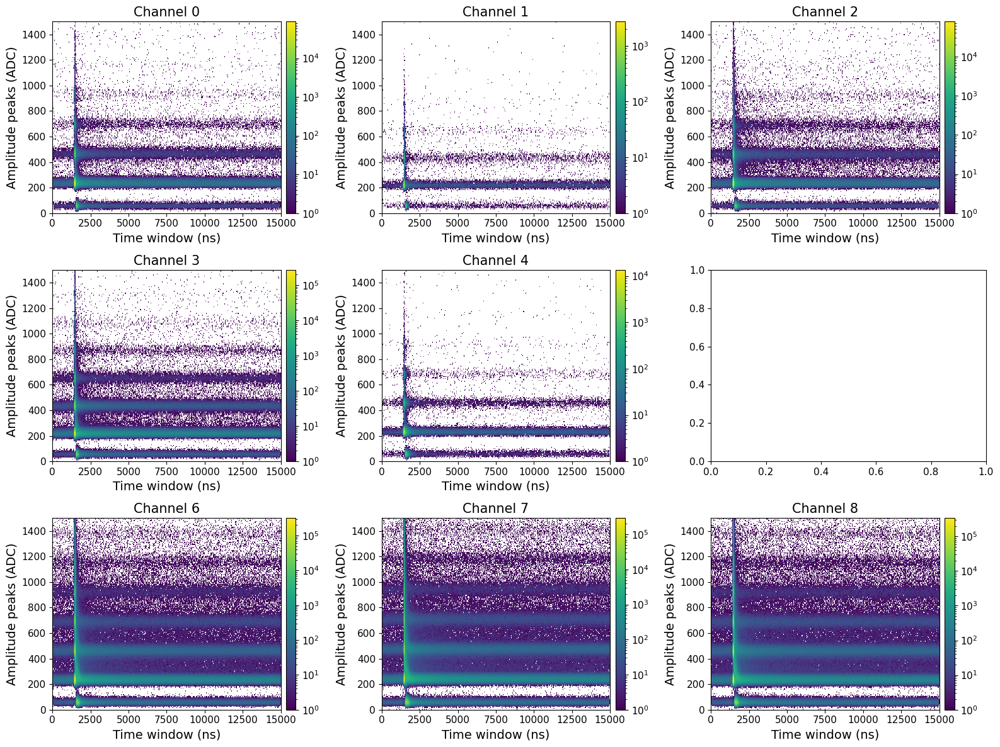

In [26]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    if k ==5:
        continue
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate([idx_peaks_ch_all    [date][k] for date in dates_no_doping])
    ch_vals = np.concatenate(([height_peaks_ch_all[date][k] for date in dates_no_doping]))
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

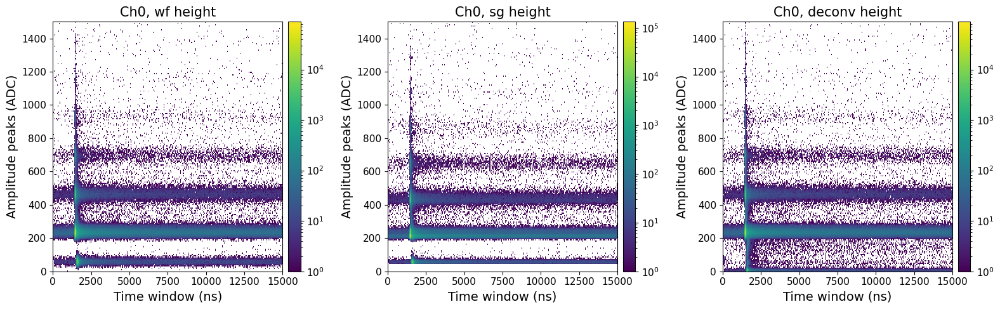

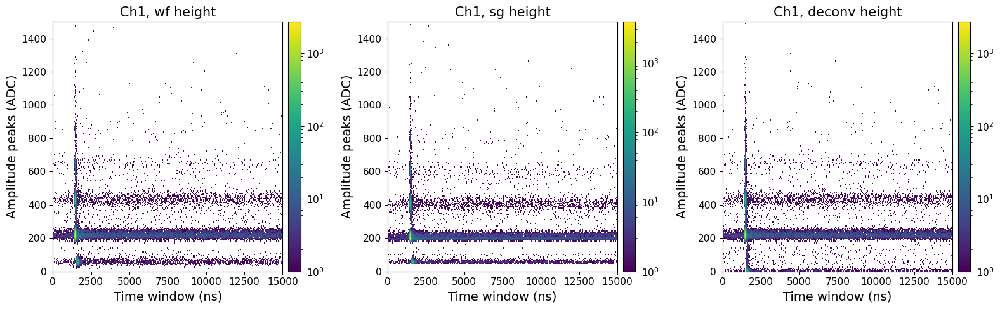

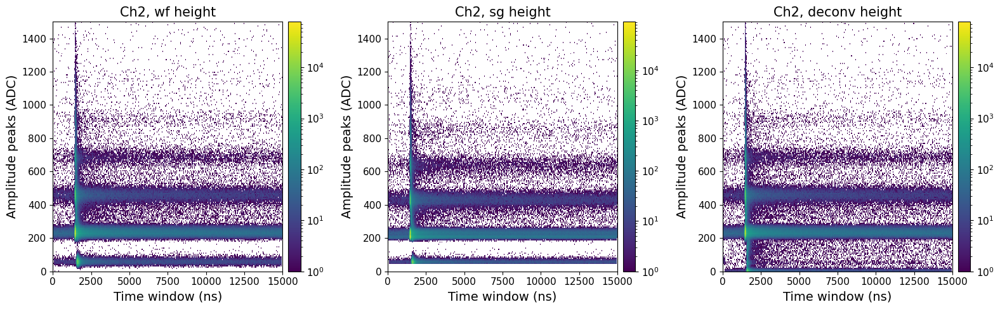

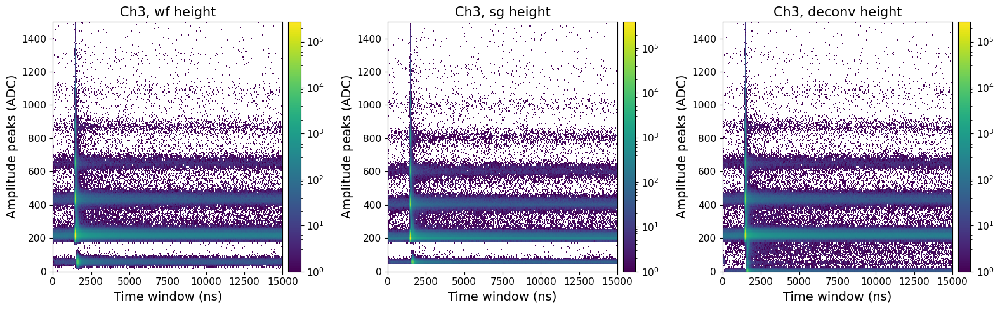

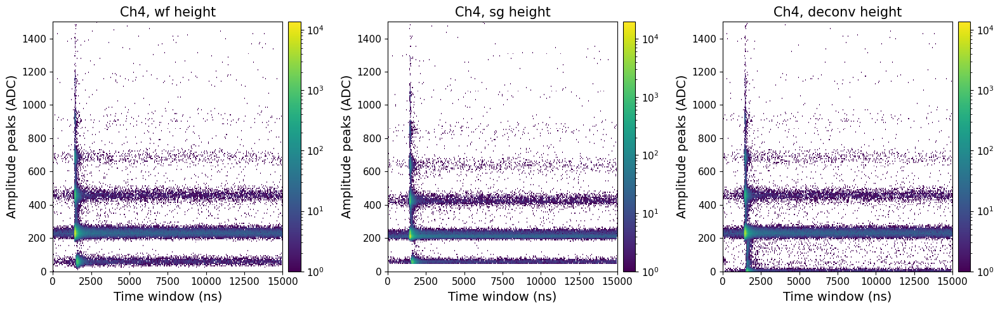

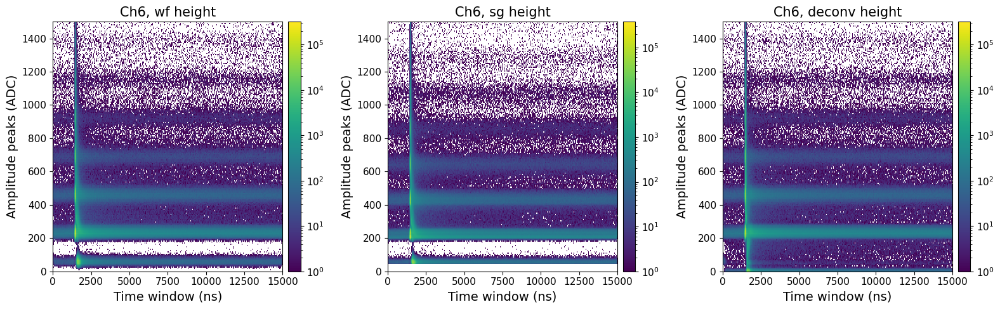

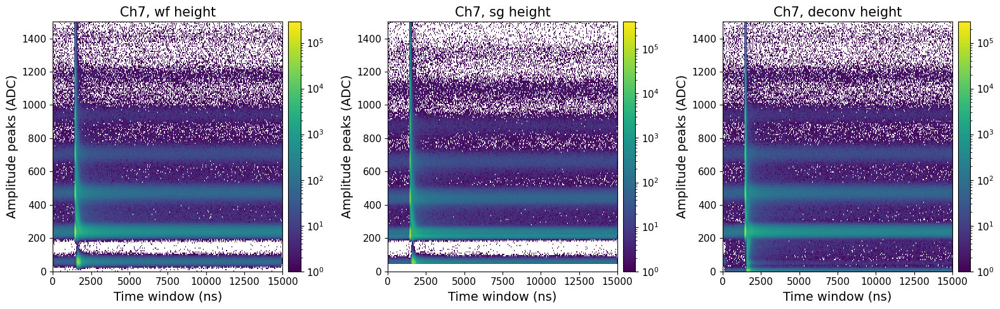

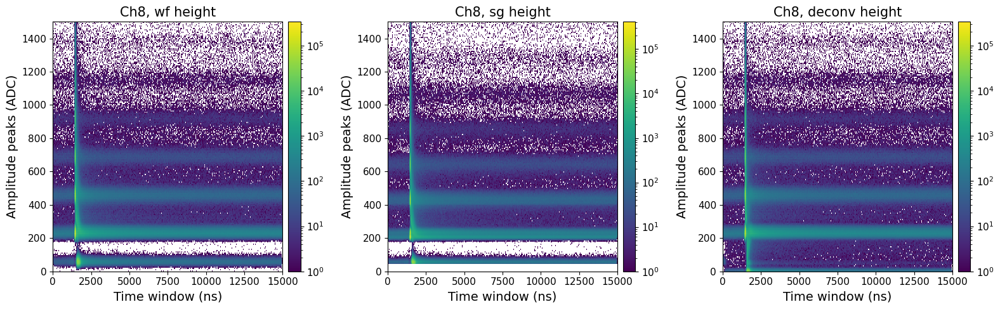

In [27]:
for k in normal_chs:
    fig, axs = plt.subplots(1, 3, figsize=(16, 5))

    ch_idxs  = np.concatenate(([idx_peaks_ch_all          [date][k] for date in dates_no_doping]))
    ch_vals1 = np.concatenate(([height_peaks_ch_all       [date][k] for date in dates_no_doping]))
    ch_vals2 = np.concatenate(([height_peaks_sg_ch_all    [date][k] for date in dates_no_doping]))
    ch_vals3 = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates_no_doping]))
    
    for ax, ch_vals, title in zip(axs, [ch_vals1, ch_vals2, ch_vals3], ['wf height', 'sg height', 'deconv height']):
        fig0 = ax.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
        ax.set_xlabel('Time window (ns)',      fontsize=14)
        ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        ax.set_title(f"Ch{k}, {title}",           fontsize=15)
        fig.colorbar(fig0[3], ax=ax, pad=0.02)
    plt.tight_layout()
    plt.show()

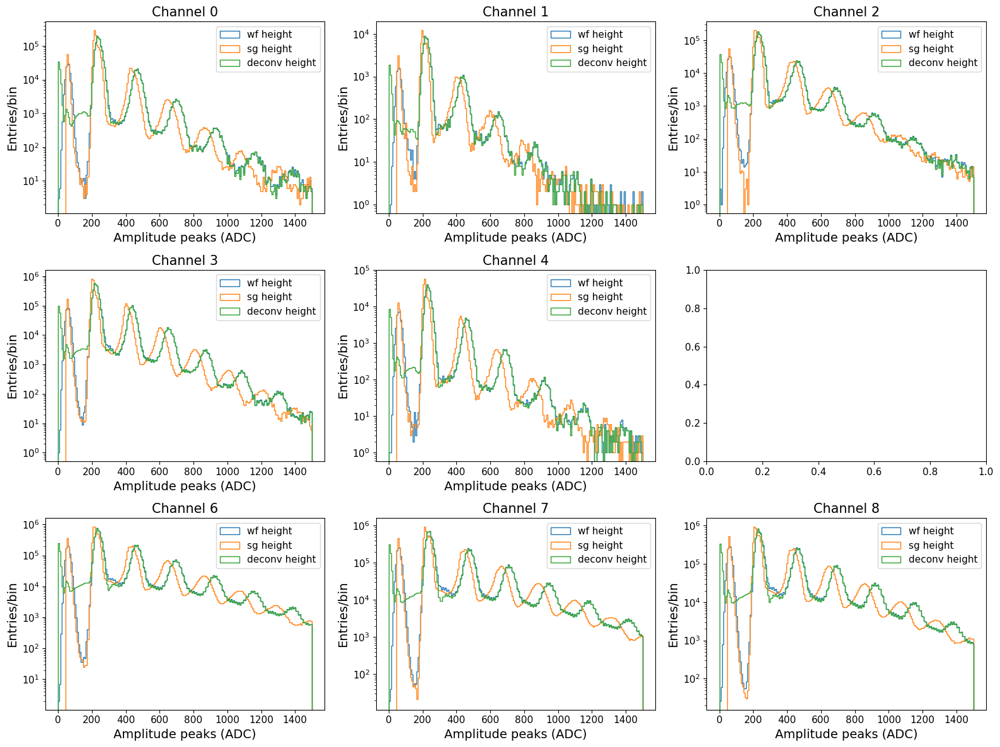

In [28]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    i = int(k/3)
    j = k%3

    ch_idxs  = np.concatenate(([idx_peaks_ch_all          [date][k] for date in dates_no_doping]))
    ch_vals1 = np.concatenate(([height_peaks_ch_all       [date][k] for date in dates_no_doping]))
    ch_vals2 = np.concatenate(([height_peaks_sg_ch_all    [date][k] for date in dates_no_doping]))
    ch_vals3 = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates_no_doping]))
    
    for ch_vals, lab in zip([ch_vals1, ch_vals2, ch_vals3], ['wf height', 'sg height', 'deconv height']):
    
        axs[i][j].hist(ch_vals, bins=200, range=(0, 1500), label=lab, histtype='step')
    
    axs[i][j].set_ylabel('Entries/bin',      fontsize=14)
    axs[i][j].set_xlabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    axs[i][j].legend()
    axs[i][j].set_yscale('log')
plt.tight_layout()
plt.show()

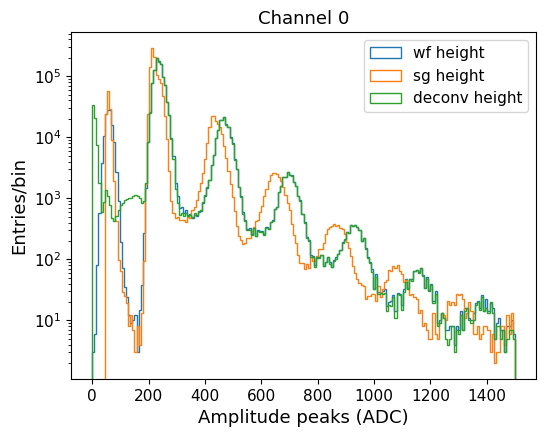

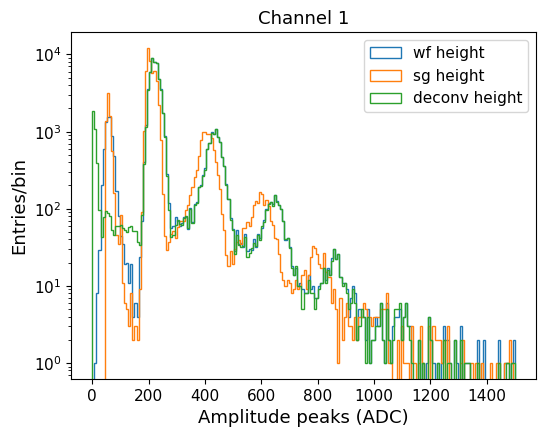

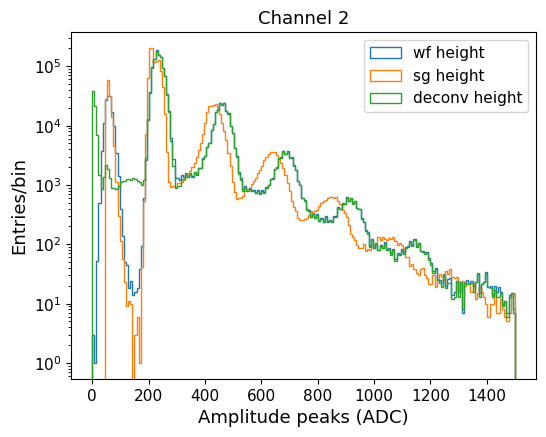

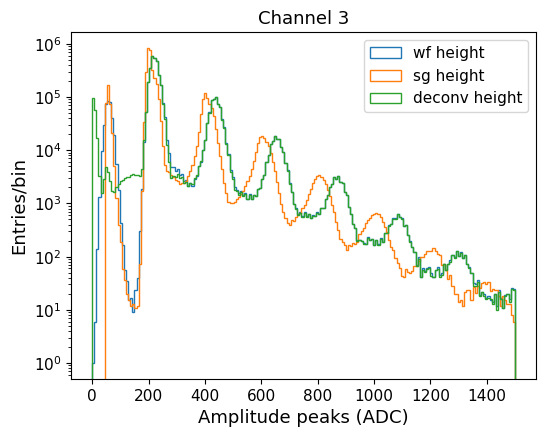

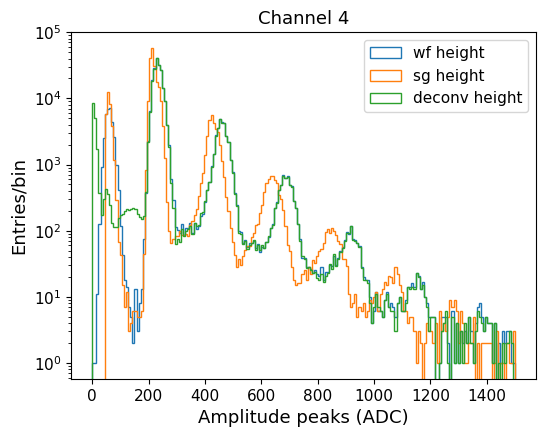

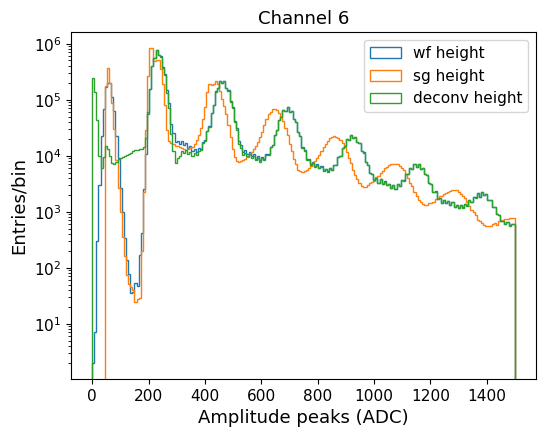

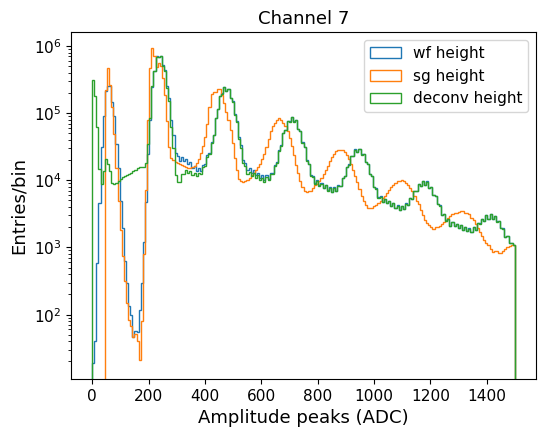

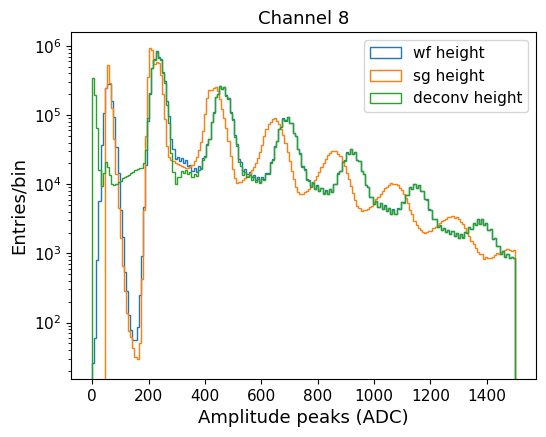

In [29]:
for k in normal_chs:
    ch_idxs  = np.concatenate(([idx_peaks_ch_all          [date][k] for date in dates_no_doping]))
    ch_vals1 = np.concatenate(([height_peaks_ch_all       [date][k] for date in dates_no_doping]))
    ch_vals2 = np.concatenate(([height_peaks_sg_ch_all    [date][k] for date in dates_no_doping]))
    ch_vals3 = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates_no_doping]))
    
    plt.figure(figsize=(6, 4.5))
    for ch_vals, lab in zip([ch_vals1, ch_vals2, ch_vals3], ['wf height', 'sg height', 'deconv height']):
    
        plt.hist(ch_vals, bins=200, range=(0, 1500), label=lab, histtype='step')
    
    plt.ylabel('Entries/bin',           fontsize=13)
    plt.xlabel('Amplitude peaks (ADC)', fontsize=13)
    plt.title(f"Channel {k}",           fontsize=13)
    plt.legend()
    plt.yscale('log')
    plt.show()

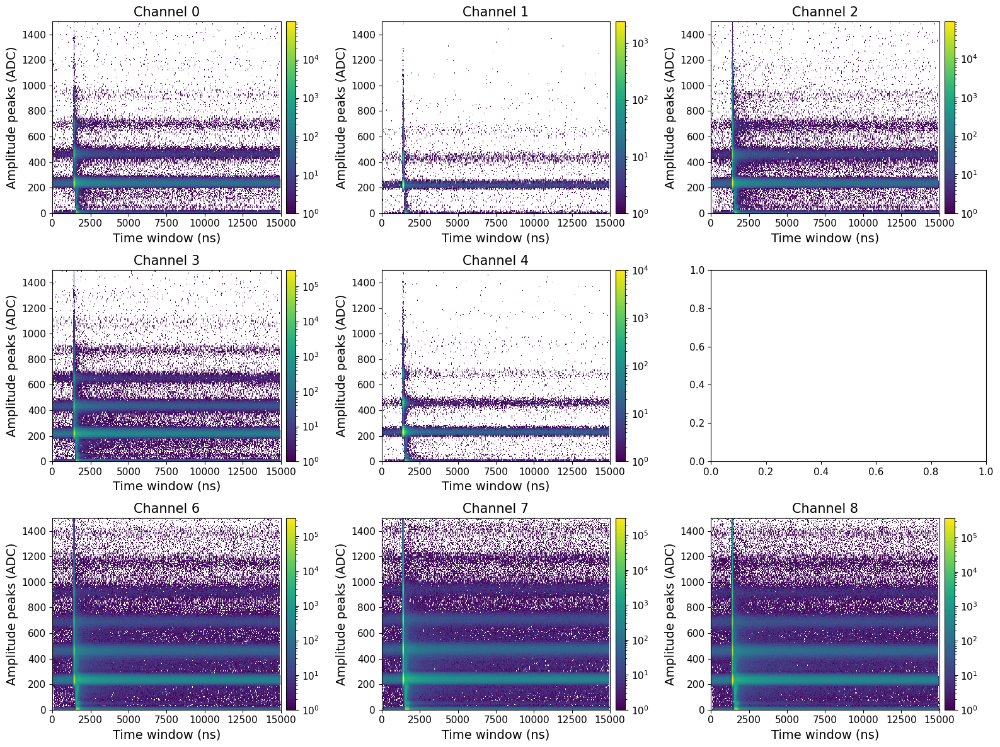

In [30]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate(([idx_peaks_thr_ch_all      [date][k] for date in dates_no_doping]))
    ch_vals = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates_no_doping]))
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

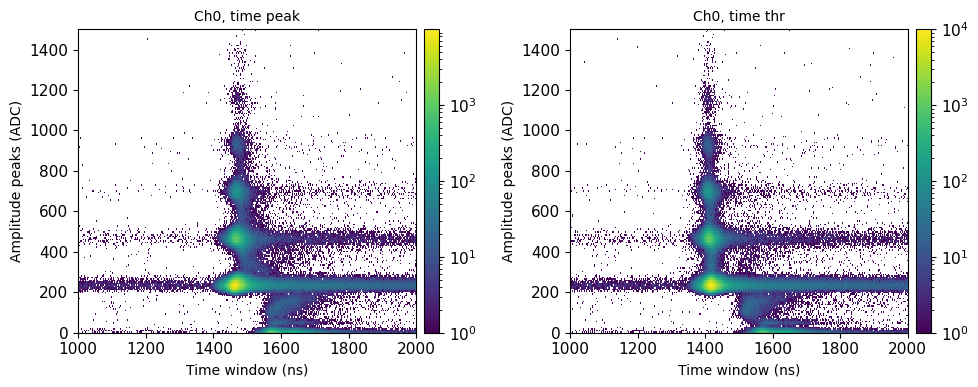

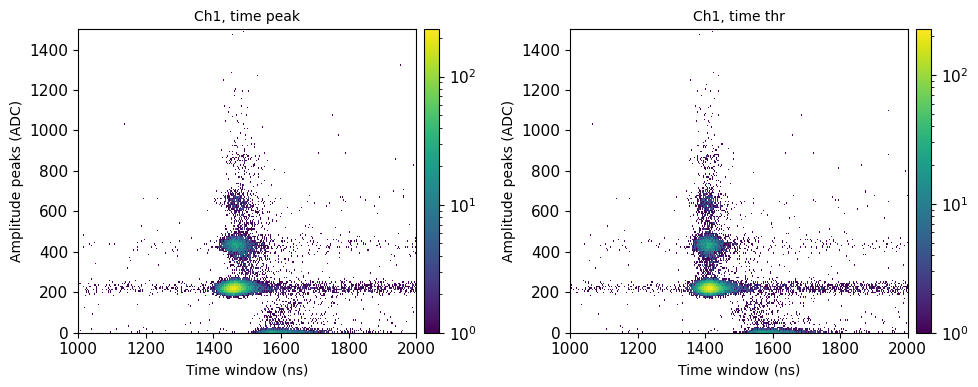

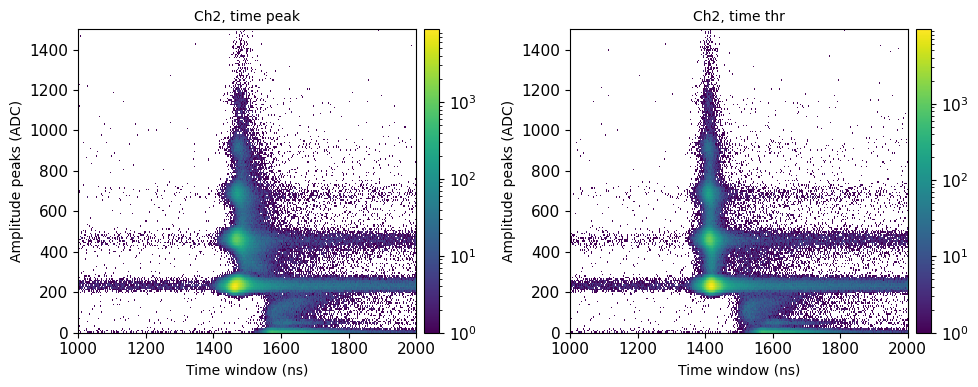

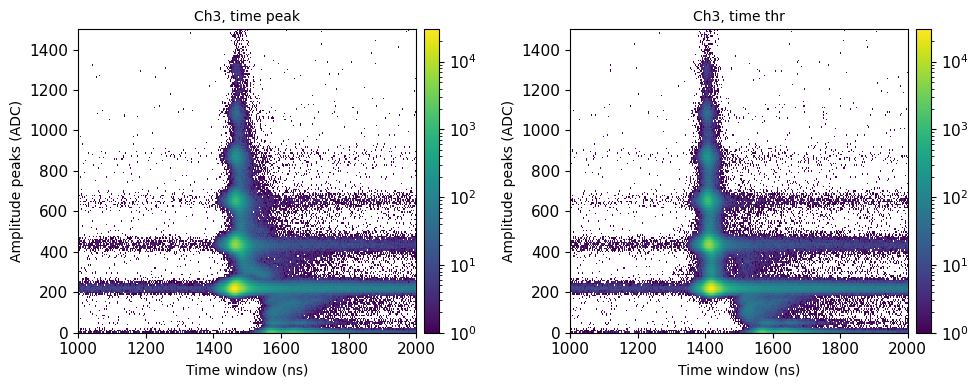

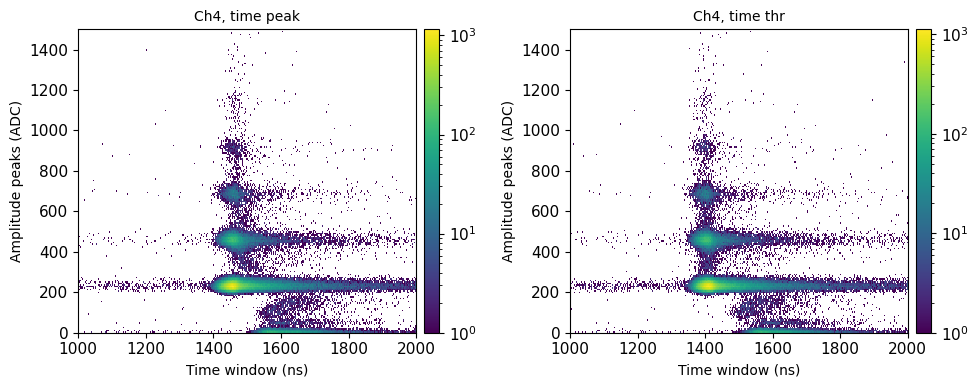

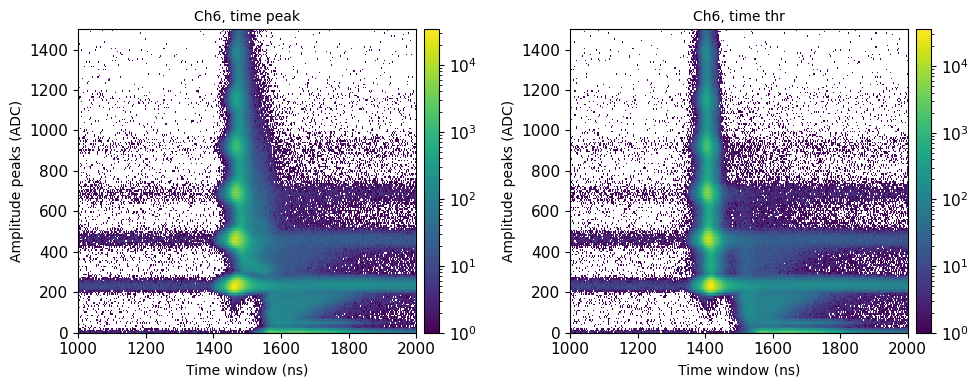

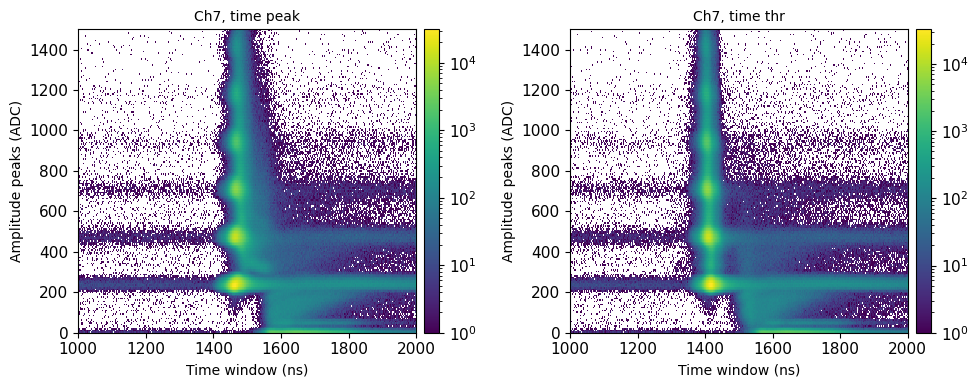

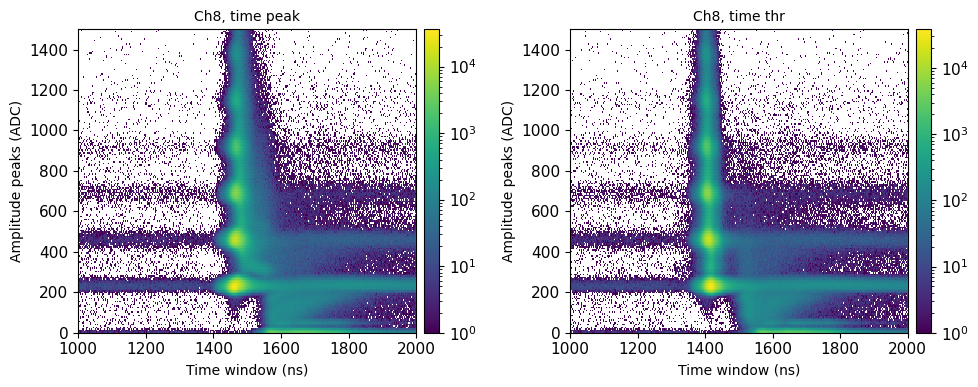

In [31]:
for k in normal_chs:

    ch_idxs1 = np.concatenate(([idx_peaks_ch_all          [date][k] for date in dates_no_doping]))
    ch_idxs2 = np.concatenate(([idx_peaks_thr_ch_all      [date][k] for date in dates_no_doping]))
    ch_vals  = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates_no_doping]))
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))    
    for ax, idx, title in zip(axs, [ch_idxs1, ch_idxs2], ['time peak', 'time thr']):
        fig0 = ax.hist2d(idx*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 1500)), cmin=1, norm=LogNorm())
        ax.set_xlabel('Time window (ns)',      fontsize=10)
        ax.set_ylabel('Amplitude peaks (ADC)', fontsize=10)
        ax.set_title(f"Ch{k}, {title}",           fontsize=10)
        fig.colorbar(fig0[3], ax=ax, pad=0.02)
    plt.tight_layout()
    plt.show()

## Trigger SiPMs

Period 11_20_2023


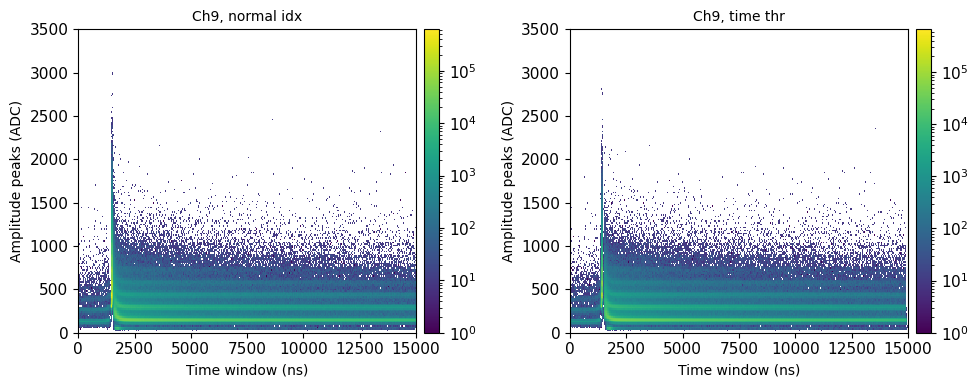

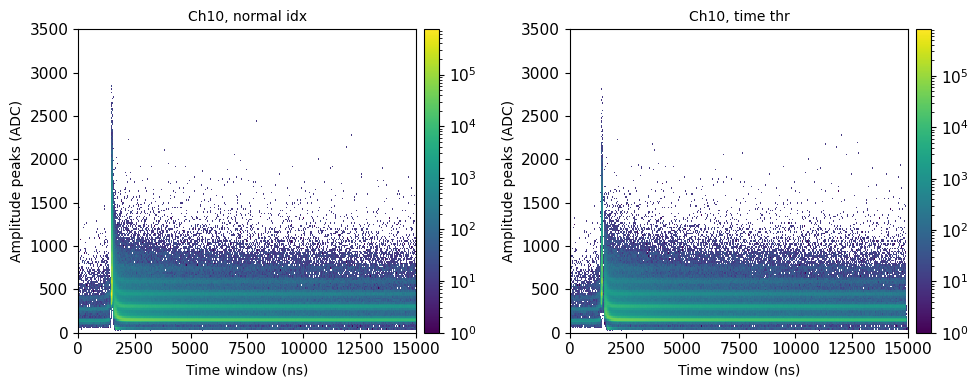

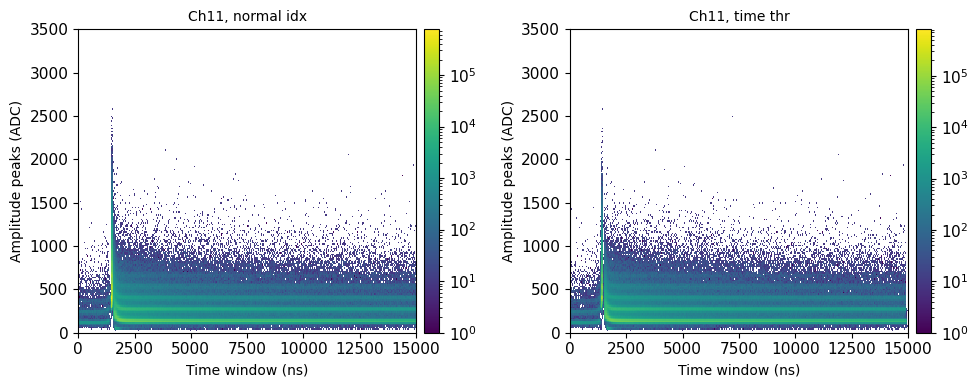

Period 11_21_2023-11_30_2023


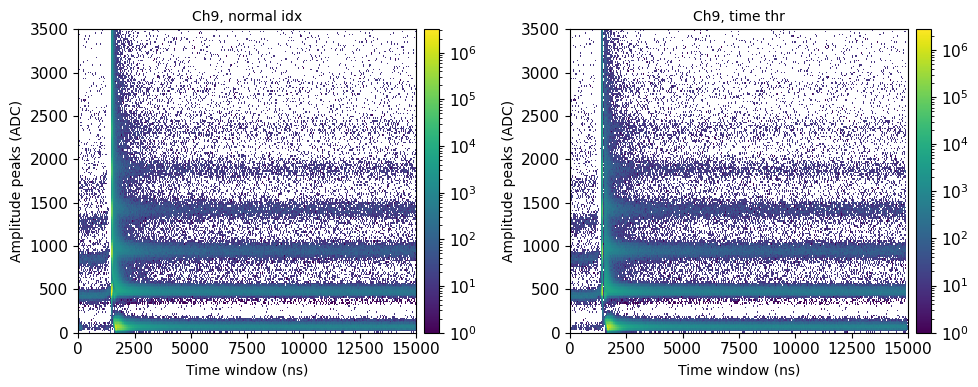

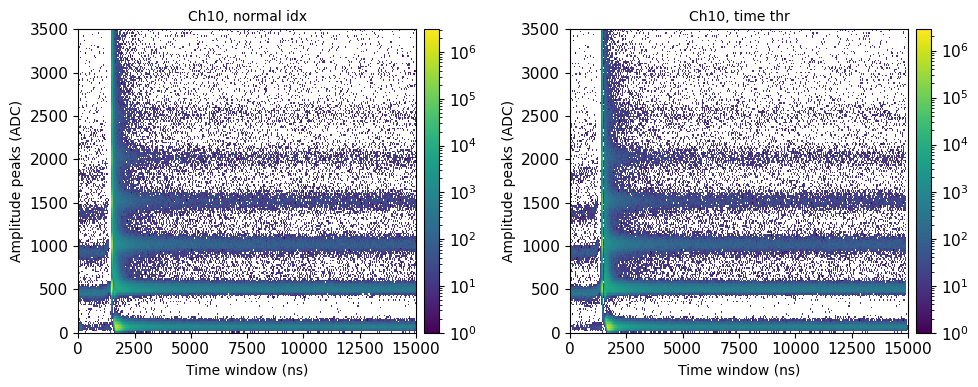

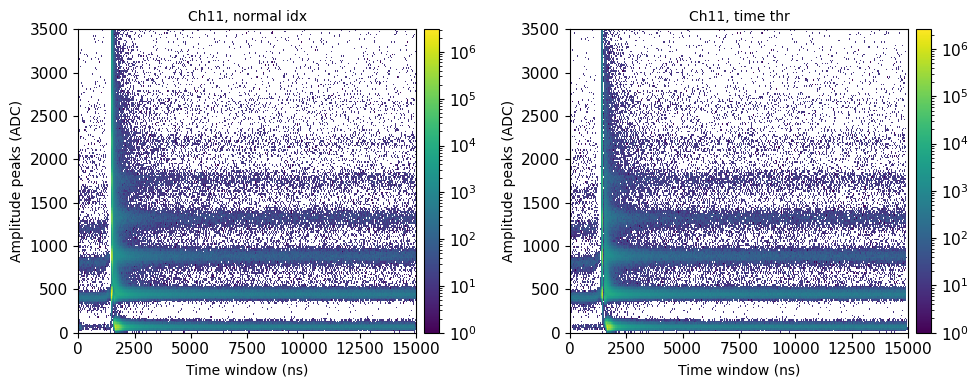

Period 12_20_2023-01_07_2024


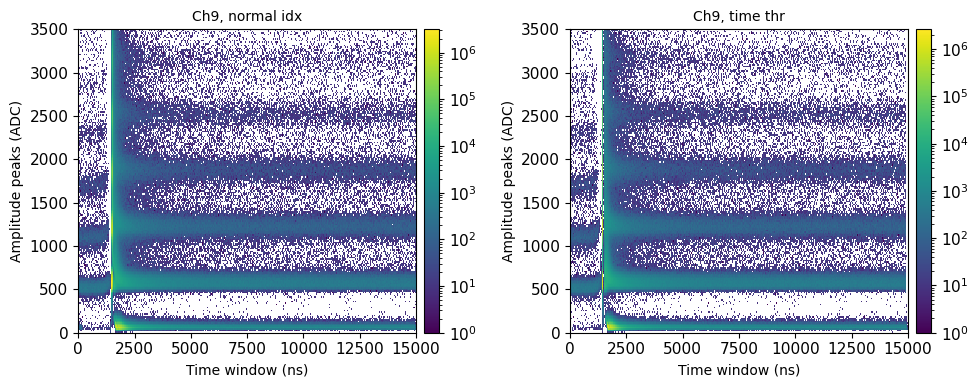

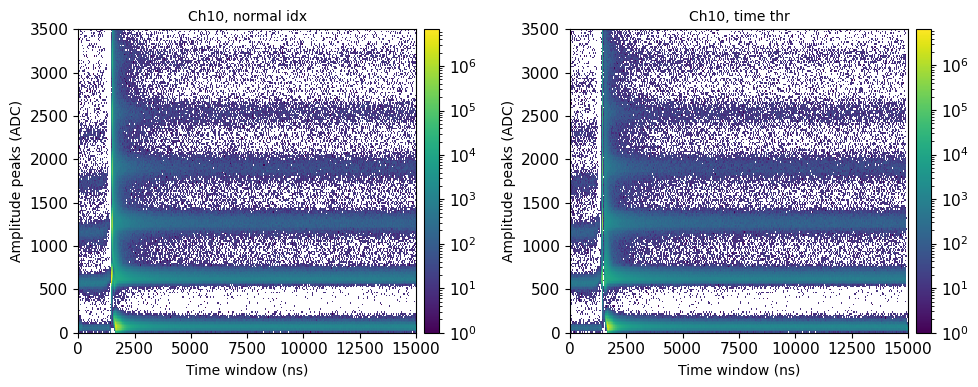

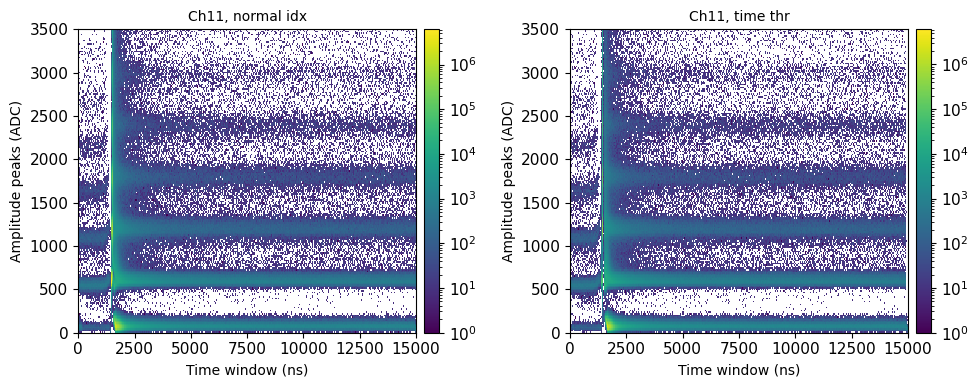

Period 01_09_2024-01_22_2024


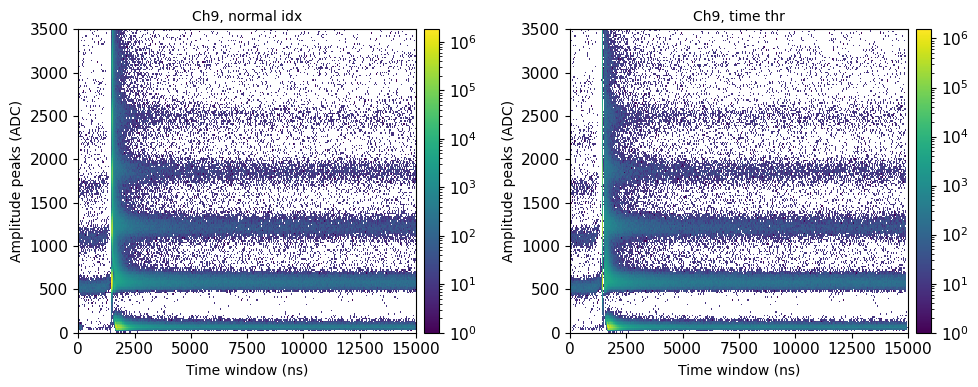

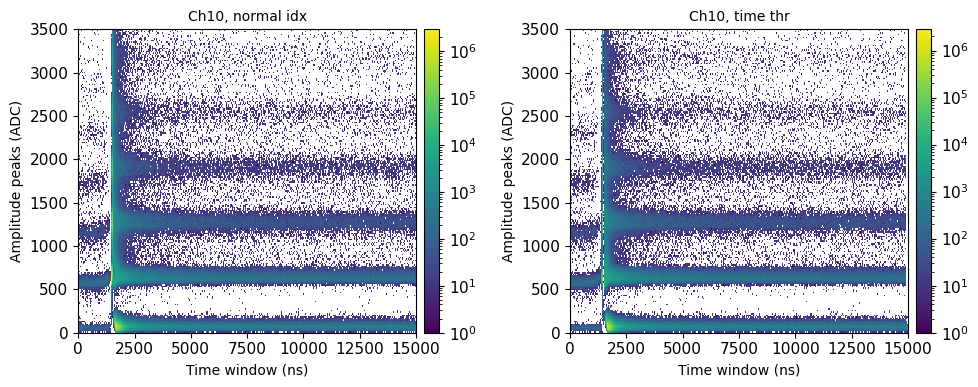

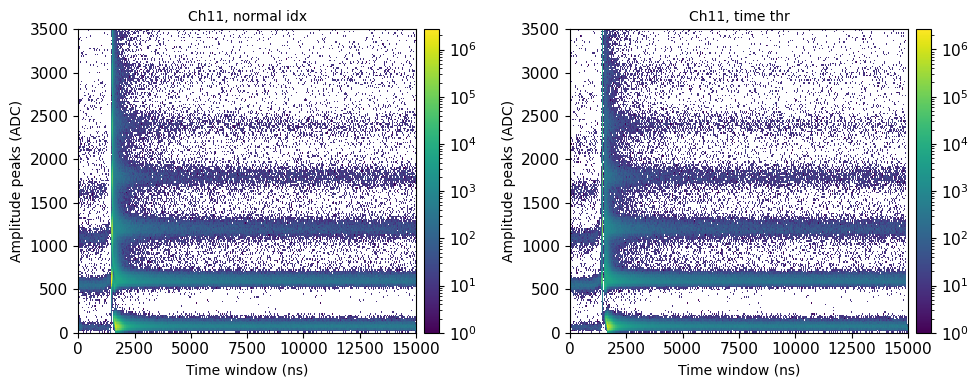

In [32]:
for dates, per in zip([['11_20_2023'],
              ['11_21_2023','11_23_2023','11_25_2023','11_26_2023','11_28_2023','11_29_2023','11_30_2023'],
              ['12_20_2023','12_21_2023','12_24_2023','12_28_2023','12_30_2023','01_01_2024','01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']], 
                      ['11_20_2023', '11_21_2023-11_30_2023', '12_20_2023-01_07_2024', '01_09_2024-01_22_2024']):

    print(f'Period {per}')
    for k in trigger_chs:

        ch_idxs1 = np.concatenate(([idx_peaks_ch_trigg_all    [date][k] for date in dates]))
        ch_idxs2 = np.concatenate(([idx_peaks_thr_ch_trigg_all[date][k] for date in dates]))
        ch_vals  = np.concatenate(([height_peaks_ch_trigg_all [date][k] for date in dates]))
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 4))    
        for ax, idx, title in zip(axs, [ch_idxs1, ch_idxs2], ['normal idx', 'time thr']):
            fig0 = ax.hist2d(idx*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 3500)), cmin=1, norm=LogNorm())
            ax.set_xlabel('Time window (ns)',      fontsize=10)
            ax.set_ylabel('Amplitude peaks (ADC)', fontsize=10)
            ax.set_title(f"Ch{k}, {title}",           fontsize=10)
            fig.colorbar(fig0[3], ax=ax, pad=0.02)
        plt.tight_layout()
        plt.show()

Period 11_20_2023


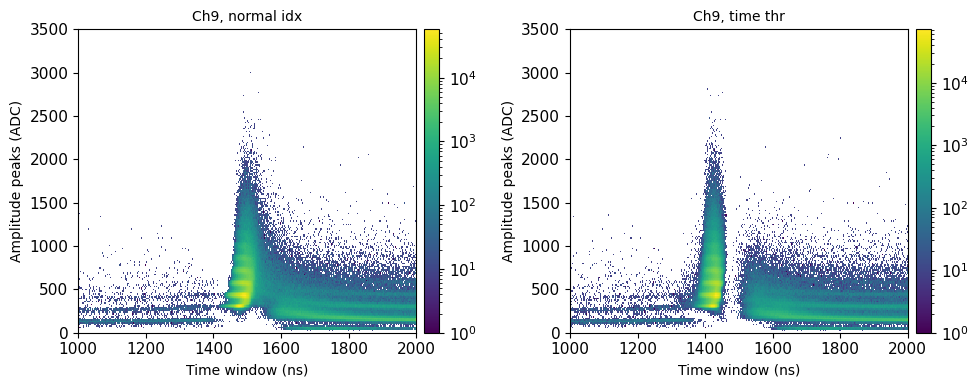

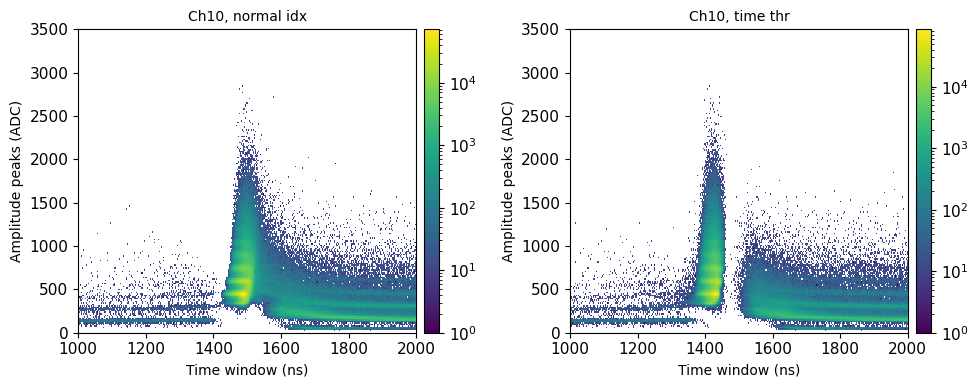

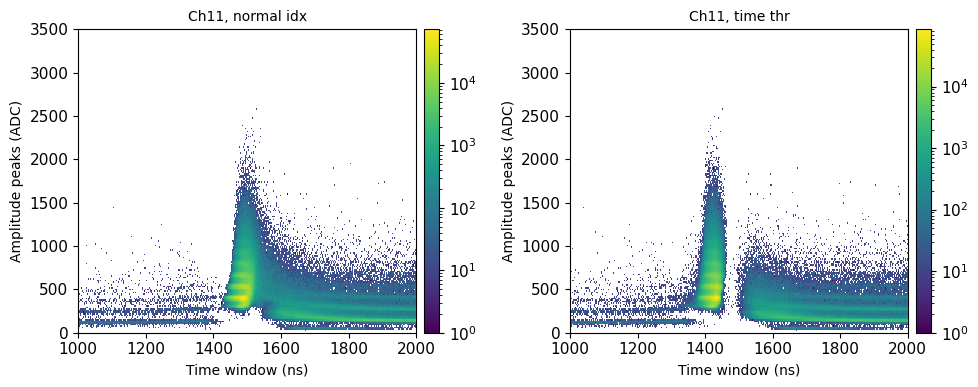

Period 11_21_2023-11_30_2023


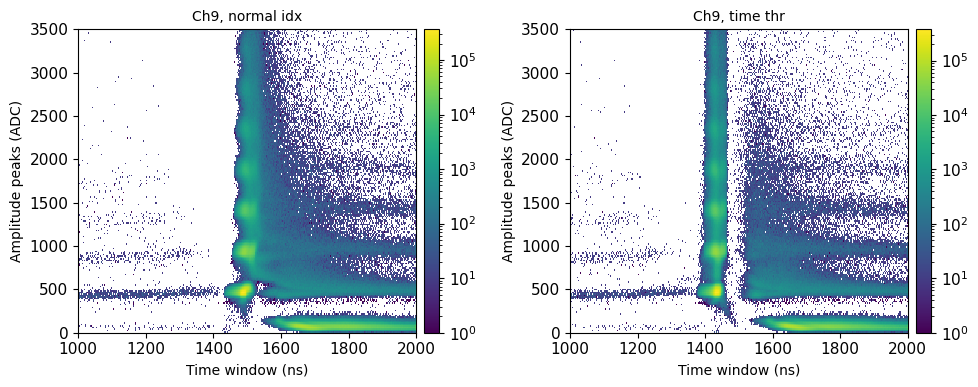

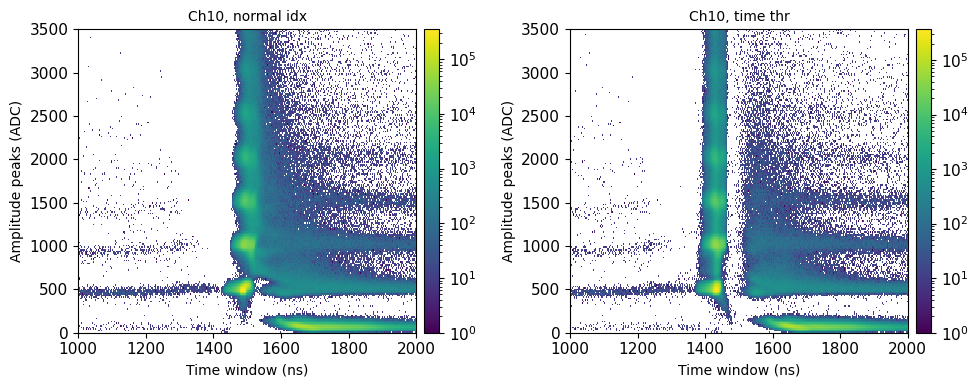

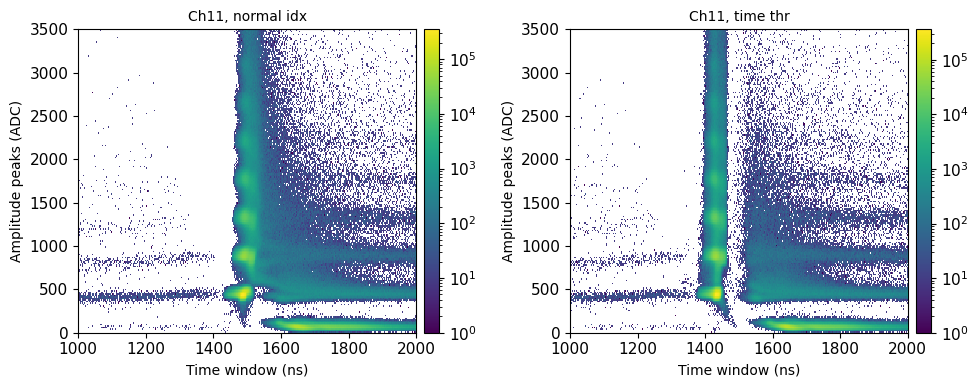

Period 12_20_2023-01_07_2024


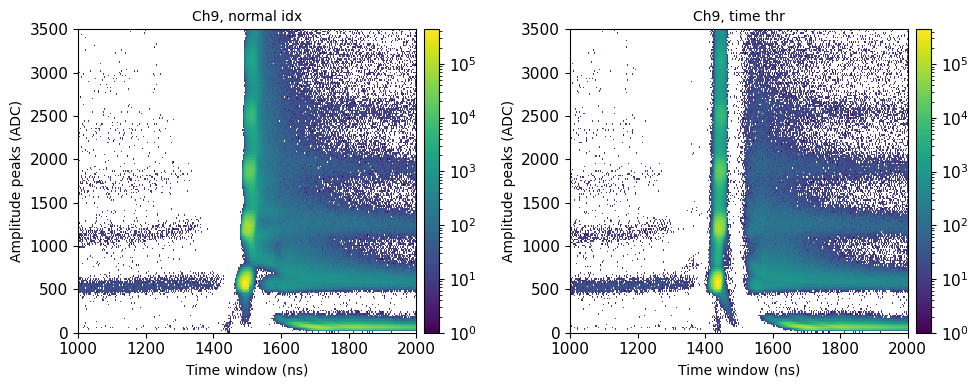

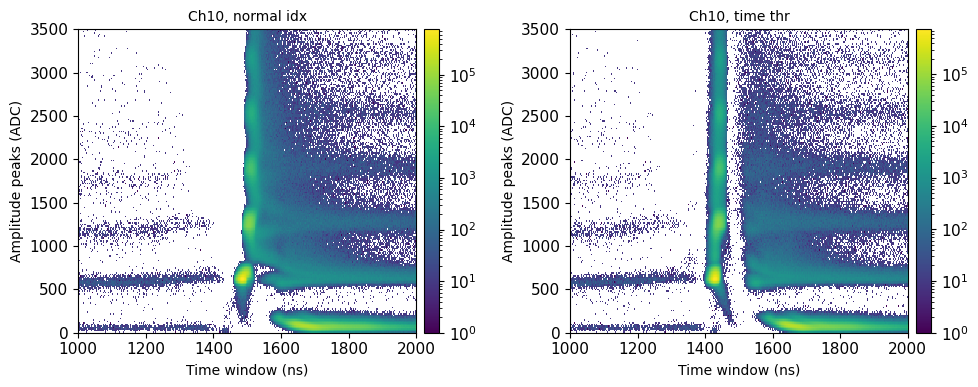

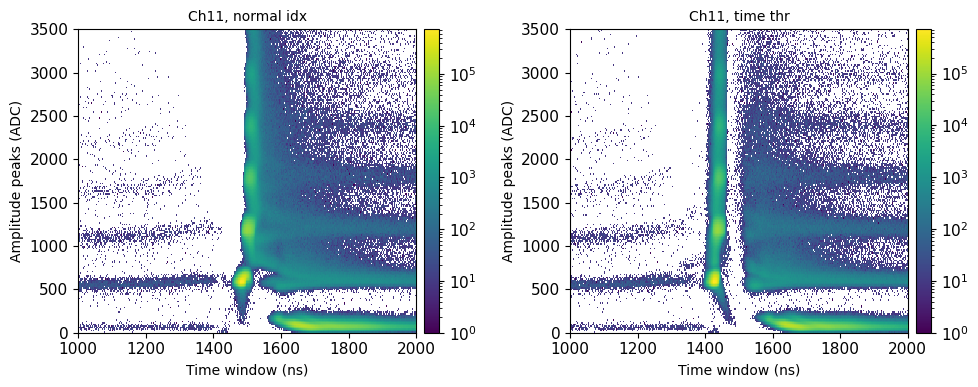

Period 01_09_2024-01_22_2024


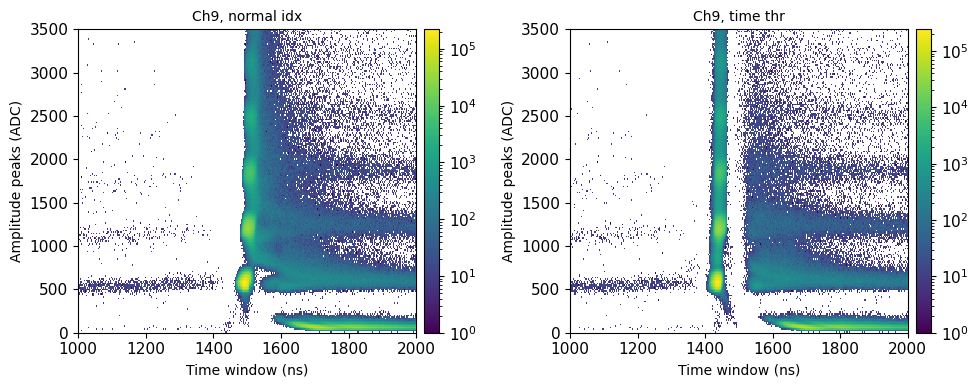

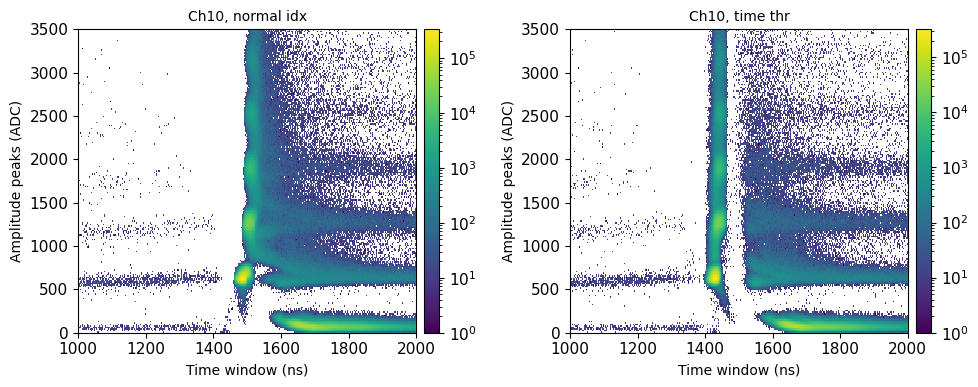

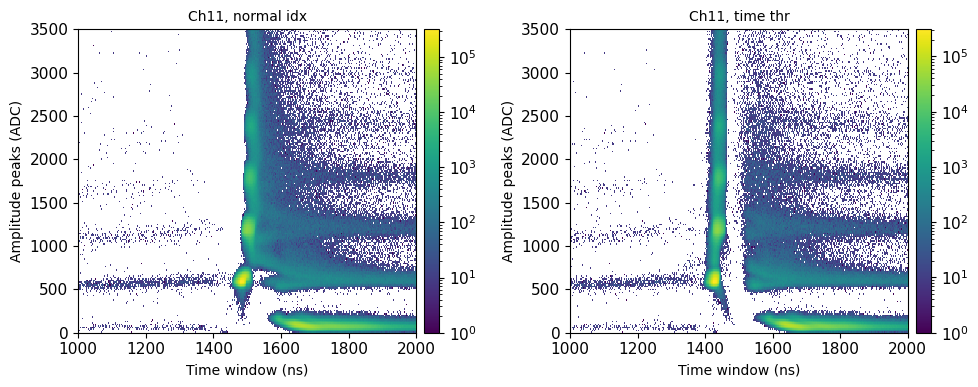

In [33]:
for dates, per in zip([['11_20_2023'],
              ['11_21_2023','11_23_2023','11_25_2023','11_26_2023','11_28_2023','11_29_2023','11_30_2023'],
              ['12_20_2023','12_21_2023','12_24_2023','12_28_2023','12_30_2023','01_01_2024','01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']], 
                      ['11_20_2023', '11_21_2023-11_30_2023', '12_20_2023-01_07_2024', '01_09_2024-01_22_2024']):

    print(f'Period {per}')
    for k in trigger_chs:

        ch_idxs1 = np.concatenate(([idx_peaks_ch_trigg_all    [date][k] for date in dates]))
        ch_idxs2 = np.concatenate(([idx_peaks_thr_ch_trigg_all[date][k] for date in dates]))
        ch_vals  = np.concatenate(([height_peaks_ch_trigg_all [date][k] for date in dates]))
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 4))    
        for ax, idx, title in zip(axs, [ch_idxs1, ch_idxs2], ['normal idx', 'time thr']):
            fig0 = ax.hist2d(idx*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 3500)), cmin=1, norm=LogNorm())
            ax.set_xlabel('Time window (ns)',      fontsize=10)
            ax.set_ylabel('Amplitude peaks (ADC)', fontsize=10)
            ax.set_title(f"Ch{k}, {title}",           fontsize=10)
            fig.colorbar(fig0[3], ax=ax, pad=0.02)
        plt.tight_layout()
        plt.show()

Period 11_20_2023


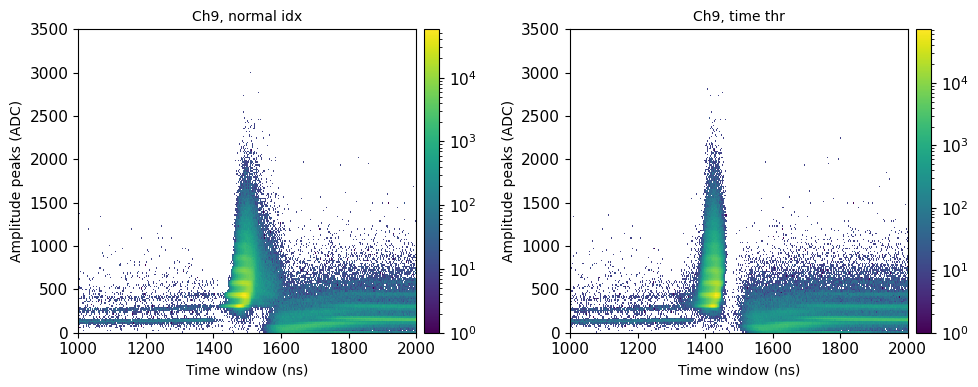

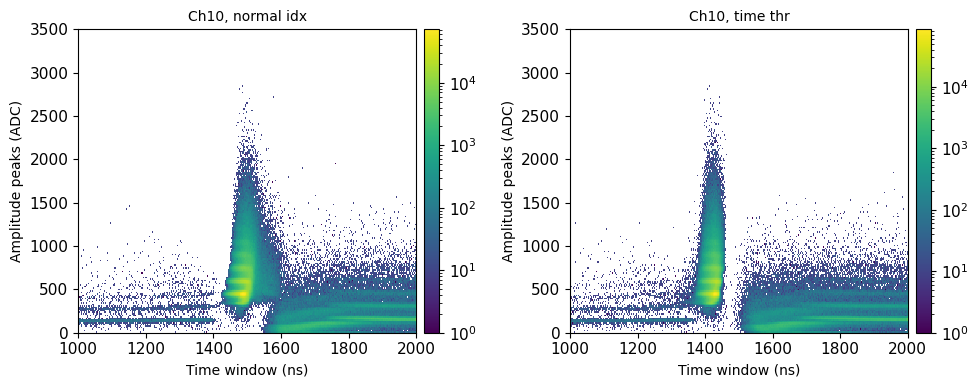

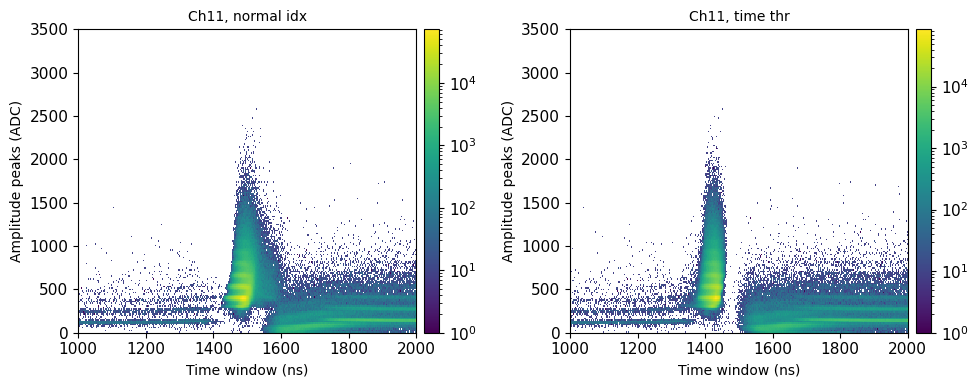

Period 11_21_2023-11_30_2023


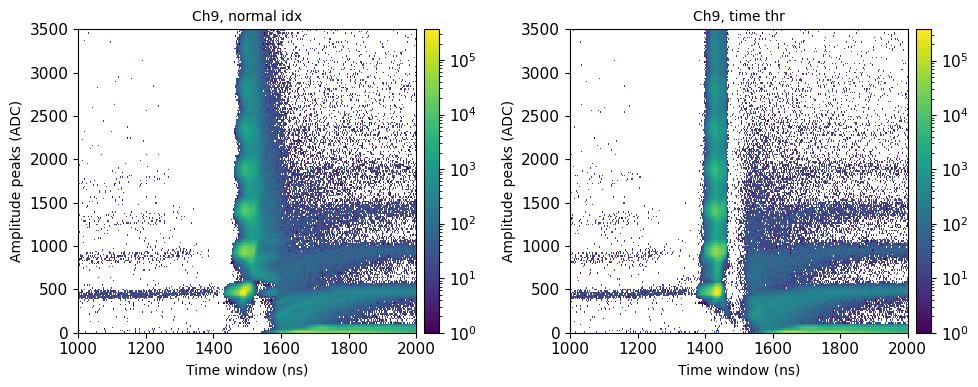

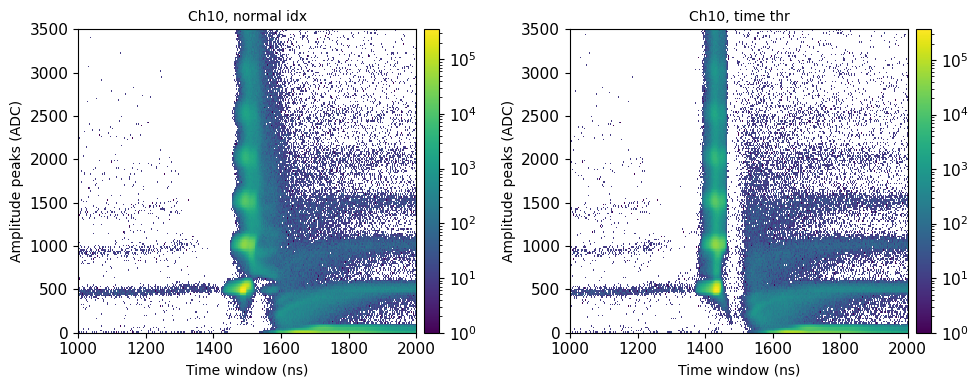

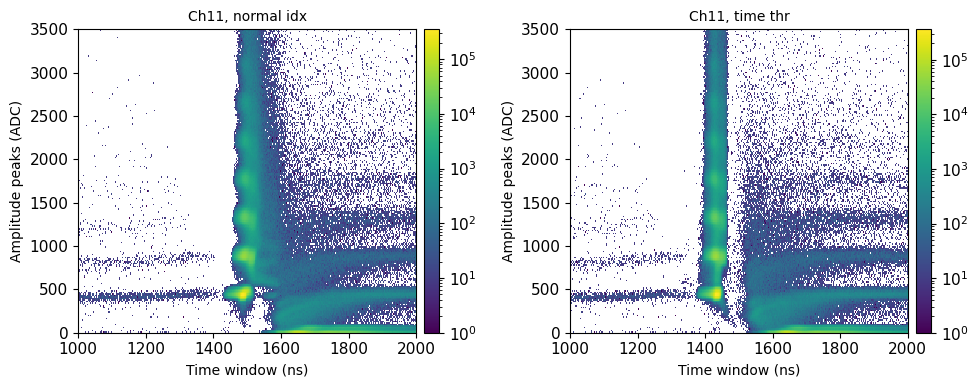

Period 12_20_2023-01_07_2024


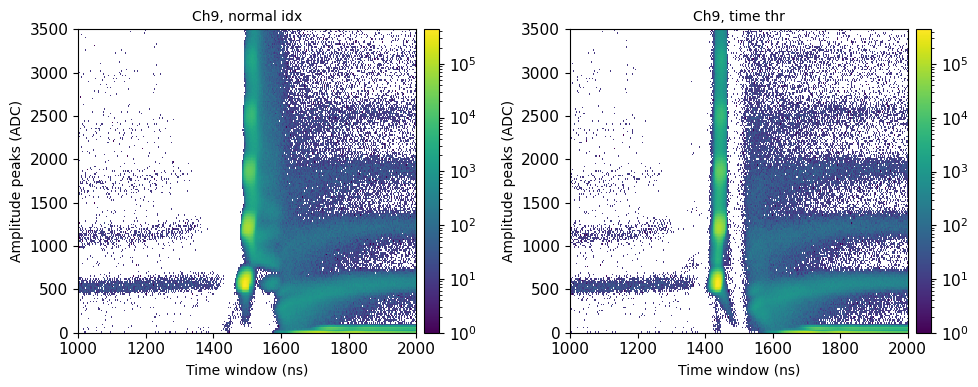

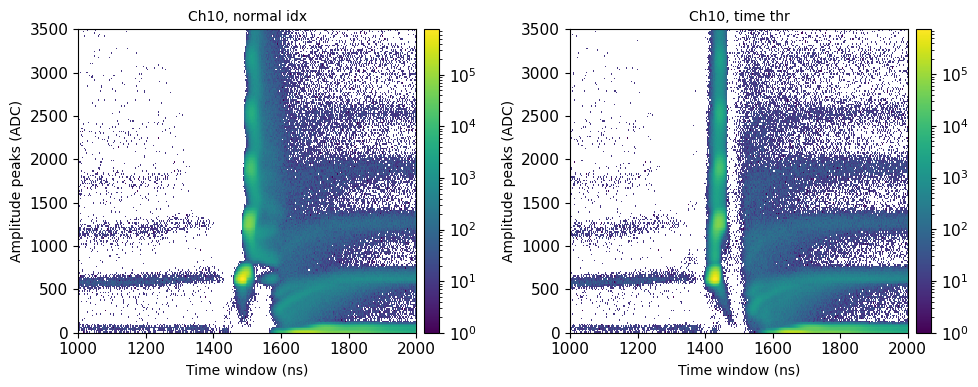

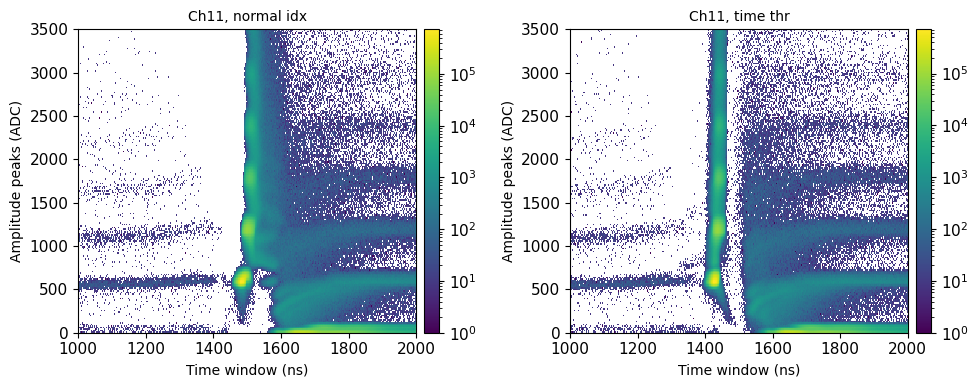

Period 01_09_2024-01_22_2024


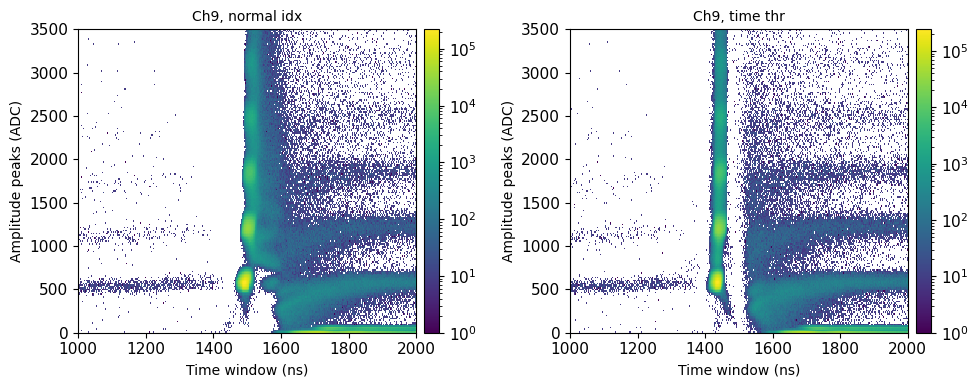

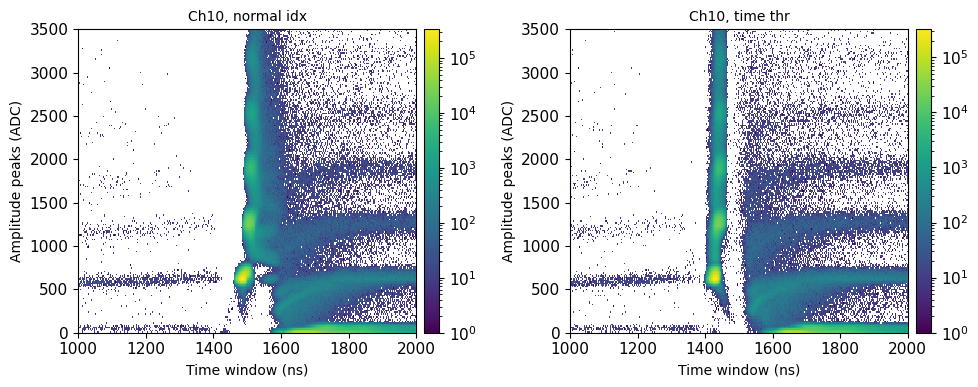

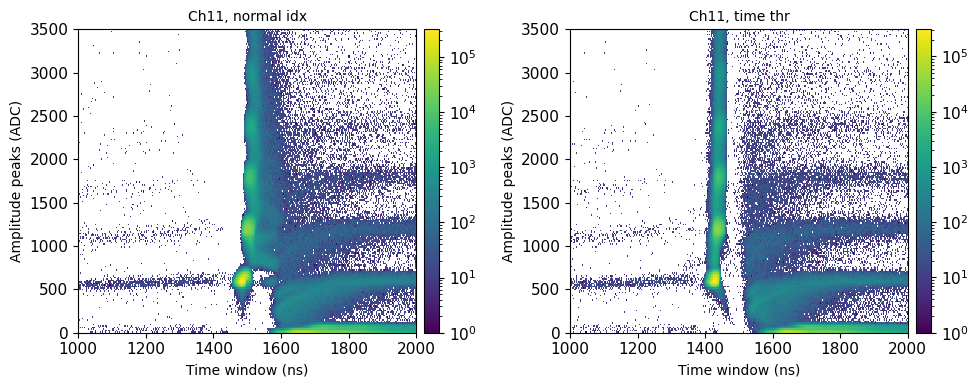

In [34]:
for dates, per in zip([['11_20_2023'],
              ['11_21_2023','11_23_2023','11_25_2023','11_26_2023','11_28_2023','11_29_2023','11_30_2023'],
              ['12_20_2023','12_21_2023','12_24_2023','12_28_2023','12_30_2023','01_01_2024','01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']], 
                      ['11_20_2023', '11_21_2023-11_30_2023', '12_20_2023-01_07_2024', '01_09_2024-01_22_2024']):

    print(f'Period {per}')
    for k in trigger_chs:

        ch_idxs1 = np.concatenate(([idx_peaks_ch_trigg_all          [date][k] for date in dates]))
        ch_idxs2 = np.concatenate(([idx_peaks_thr_ch_trigg_all      [date][k] for date in dates]))
        ch_vals  = np.concatenate(([height_peaks_deconv_ch_trigg_all[date][k] for date in dates]))
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 4))    
        for ax, idx, title in zip(axs, [ch_idxs1, ch_idxs2], ['normal idx', 'time thr']):
            fig0 = ax.hist2d(idx*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 3500)), cmin=1, norm=LogNorm())
            ax.set_xlabel('Time window (ns)',      fontsize=10)
            ax.set_ylabel('Amplitude peaks (ADC)', fontsize=10)
            ax.set_title(f"Ch{k}, {title}",           fontsize=10)
            fig.colorbar(fig0[3], ax=ax, pad=0.02)
        plt.tight_layout()
        plt.show()

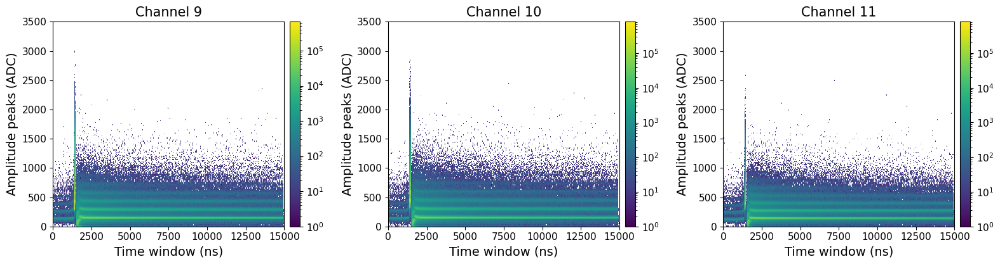

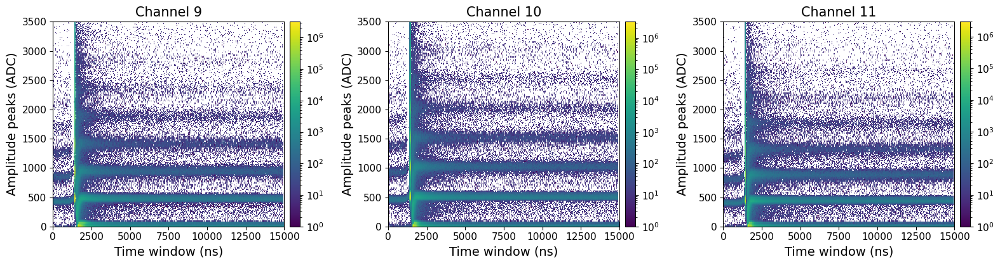

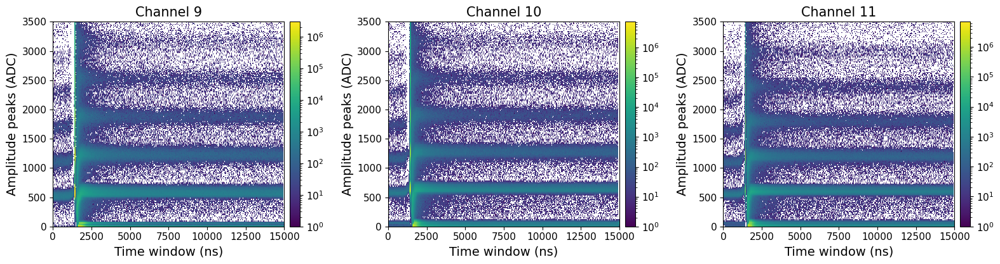

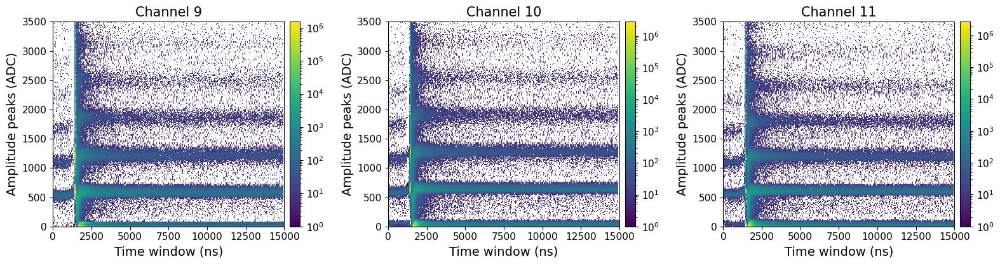

In [35]:
for dates in [['11_20_2023'],
              ['11_21_2023','11_23_2023','11_24_2023','11_25_2023','11_26_2023','11_28_2023','11_29_2023','11_30_2023'],
              ['12_20_2023','12_21_2023','12_24_2023','12_26_2023','12_28_2023','12_30_2023','01_01_2024','01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']]:

    fig, axs = plt.subplots(1, 3, figsize=(16, 4.3))
    for k, ch in enumerate(trigger_chs):
        j = k%3
        ch_idxs = np.concatenate(([idx_peaks_thr_ch_trigg_all      [date][ch] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_trigg_all[date][ch] for date in dates]))
        fig0 = axs[j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 3500)), cmin=1, norm=LogNorm())
        
        axs[j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[j], pad=0.02)
    plt.tight_layout()
    plt.show()

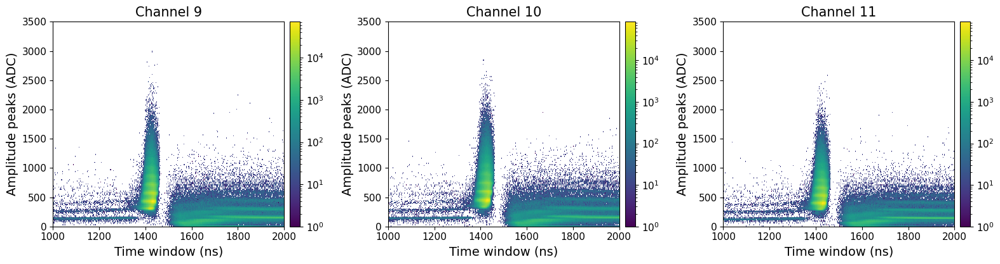

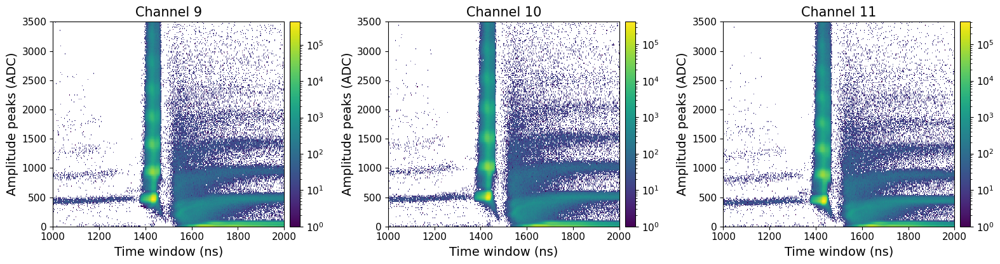

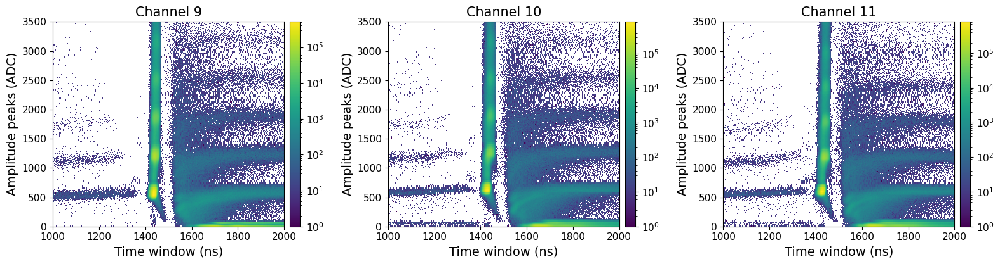

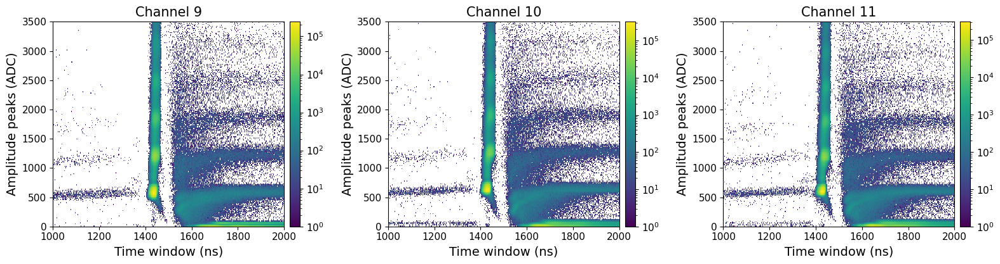

In [39]:
for dates in [['11_20_2023'],
              ['11_21_2023','11_23_2023','11_24_2023','11_25_2023','11_26_2023','11_28_2023','11_29_2023','11_30_2023'],
              ['12_20_2023','12_21_2023','12_24_2023','12_26_2023','12_28_2023','12_30_2023','01_01_2024','01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']]:

    fig, axs = plt.subplots(1, 3, figsize=(16, 4.3))
    for k, ch in enumerate(trigger_chs):
        j = k%3
        ch_idxs = np.concatenate(([idx_peaks_thr_ch_trigg_all      [date][ch] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_trigg_all[date][ch] for date in dates]))
        fig0 = axs[j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 3500)), cmin=1, norm=LogNorm())
        
        axs[j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[j], pad=0.02)
    plt.tight_layout()
    plt.show()

### Compare more in detail doping and no doping

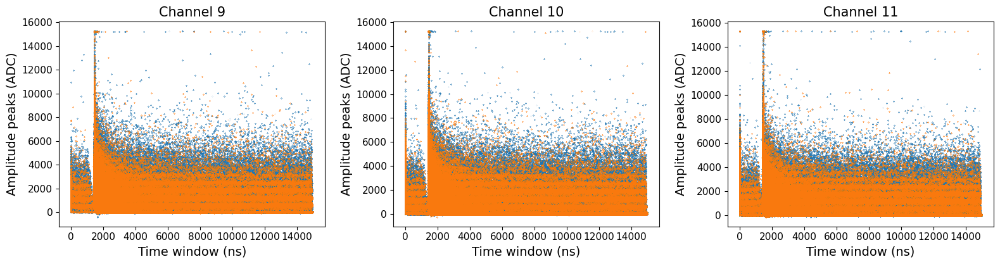

In [43]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4.3))
for dates in [['12_20_2023','12_21_2023','12_24_2023','12_26_2023','12_28_2023','12_30_2023','01_01_2024',
               '01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
              ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']]:


    for k, ch in enumerate(trigger_chs):
        j = k%3
        ch_idxs = np.concatenate(([idx_peaks_thr_ch_trigg_all      [date][ch] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_trigg_all[date][ch] for date in dates]))
        axs[j].scatter(ch_idxs*2, ch_vals, s=0.01)
        
        axs[j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[j].set_title(f"Channel {ch}",          fontsize=15)
plt.tight_layout()
plt.show()

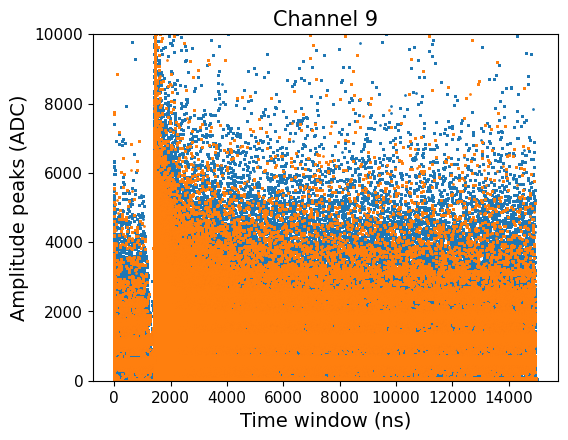

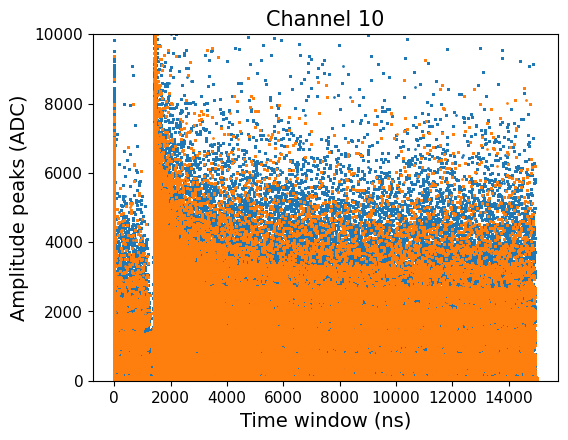

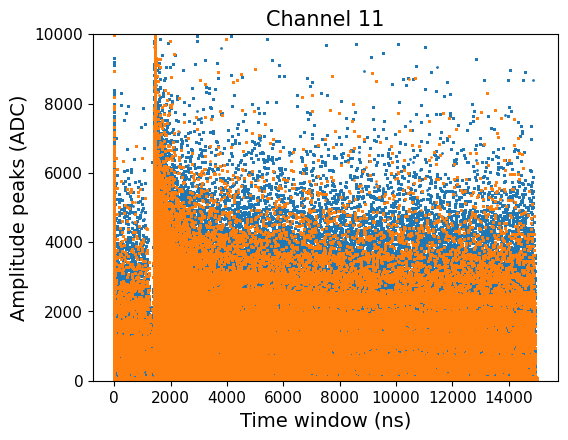

In [46]:
for k, ch in enumerate(trigger_chs):
    plt.figure(figsize=(6, 4.5))
    for dates in [['12_20_2023','12_21_2023','12_24_2023','12_26_2023','12_28_2023','12_30_2023','01_01_2024',
                   '01_02_2024','01_04_2024','01_05_2024','01_07_2024'],
                  ['01_09_2024','01_10_2024','01_12_2024','01_15_2024','01_17_2024','01_18_2024','01_22_2024']]:

        ch_idxs = np.concatenate(([idx_peaks_thr_ch_trigg_all      [date][ch] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_trigg_all[date][ch] for date in dates]))
        plt.scatter(ch_idxs*2, ch_vals, s=1)
        
    plt.xlabel('Time window (ns)',      fontsize=14)
    plt.ylabel('Amplitude peaks (ADC)', fontsize=14)
    plt.title(f"Channel {ch}",          fontsize=15)
    plt.ylim(0, 10000)
    plt.show()

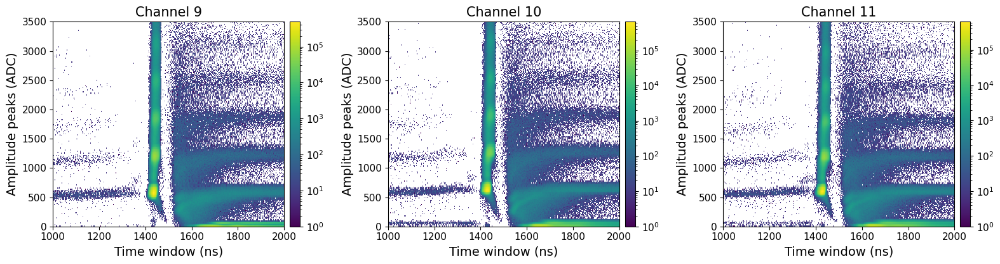

In [12]:
dates = dates_xe_4ppm

fig, axs = plt.subplots(1, 3, figsize=(16, 4.3))
for k, ch in enumerate(trigger_chs):
    j = k%3
    ch_idxs = np.concatenate(([idx_peaks_thr_ch_trigg_all_xe_dop      [date][ch] for date in dates]))
    ch_vals = np.concatenate(([height_peaks_deconv_ch_trigg_all_xe_dop[date][ch] for date in dates]))
    fig0 = axs[j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 3500)), cmin=1, norm=LogNorm())
    
    axs[j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[j].set_title(f"Channel {ch}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[j], pad=0.02)
plt.tight_layout()
plt.show()

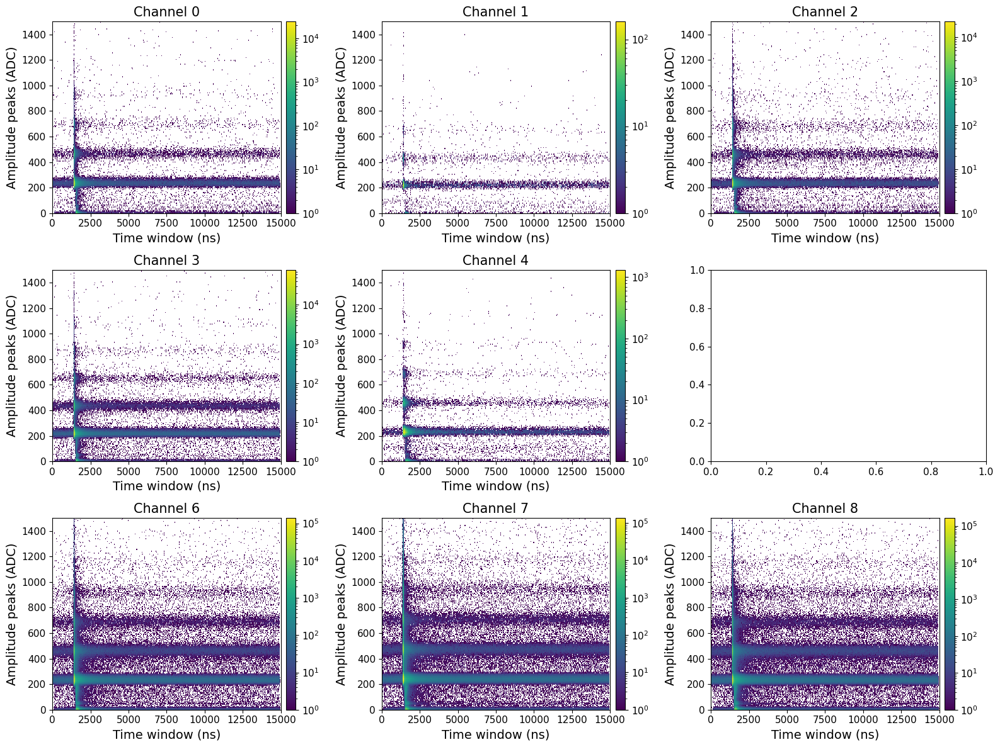

In [18]:
dates = dates_xe_4ppm

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate(([idx_peaks_thr_ch_all_xe_dop      [date][k] for date in dates]))
    ch_vals = np.concatenate(([height_peaks_deconv_ch_all_xe_dop[date][k] for date in dates]))
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

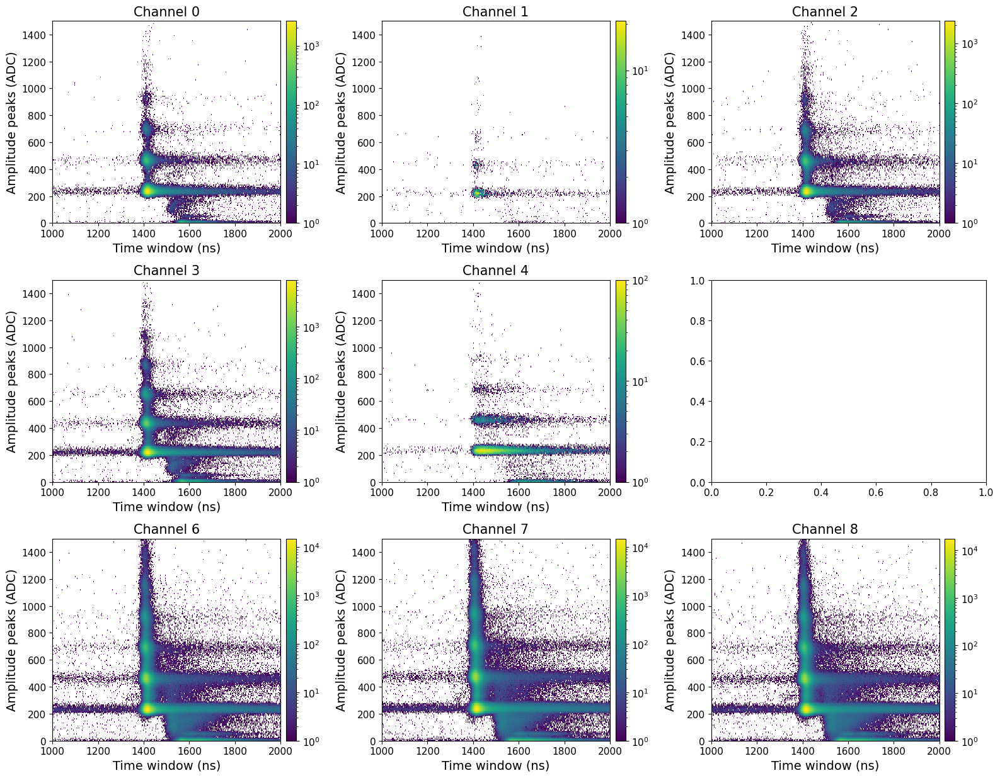

In [37]:
dates = dates_xe_4ppm

fig, axs = plt.subplots(3, 3, figsize=(16, 12.5))
for k in normal_chs:
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate(([idx_peaks_thr_ch_all_xe_dop      [date][k] for date in dates]))
    ch_vals = np.concatenate(([height_peaks_deconv_ch_all_xe_dop[date][k] for date in dates]))
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 1500)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

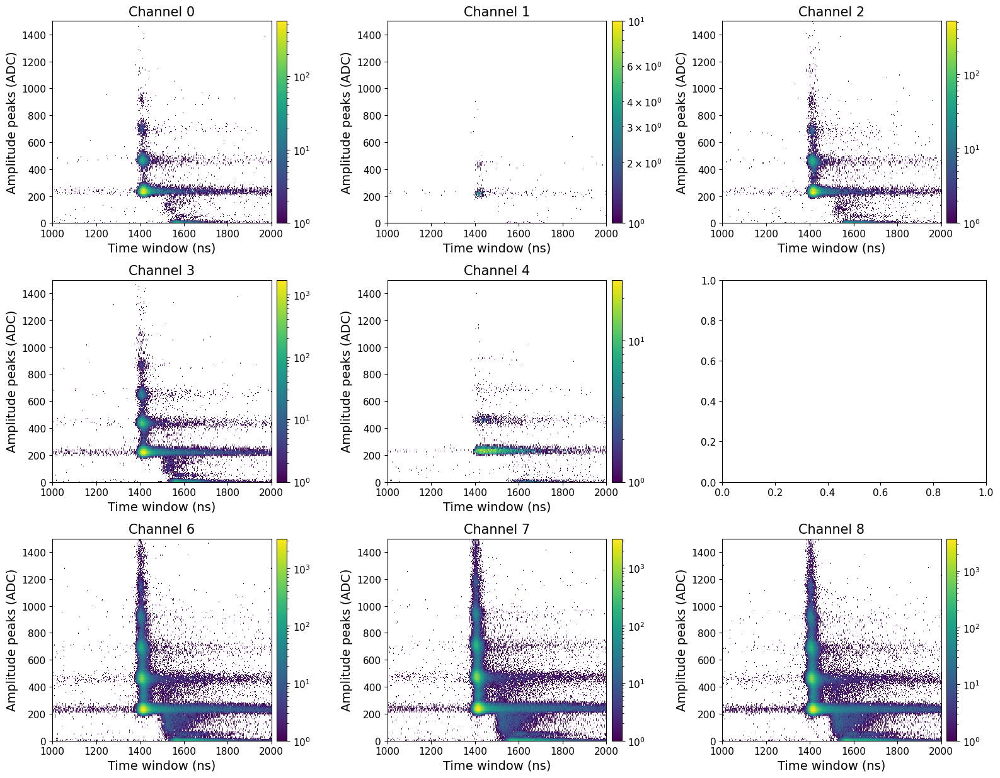

In [36]:
dates = dates_xe_6ppm[:1]

fig, axs = plt.subplots(3, 3, figsize=(16, 12.5))
for k in normal_chs:
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate(([idx_peaks_thr_ch_all_xe_dop      [date][k] for date in dates]))
    ch_vals = np.concatenate(([height_peaks_deconv_ch_all_xe_dop[date][k] for date in dates]))
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 1500)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

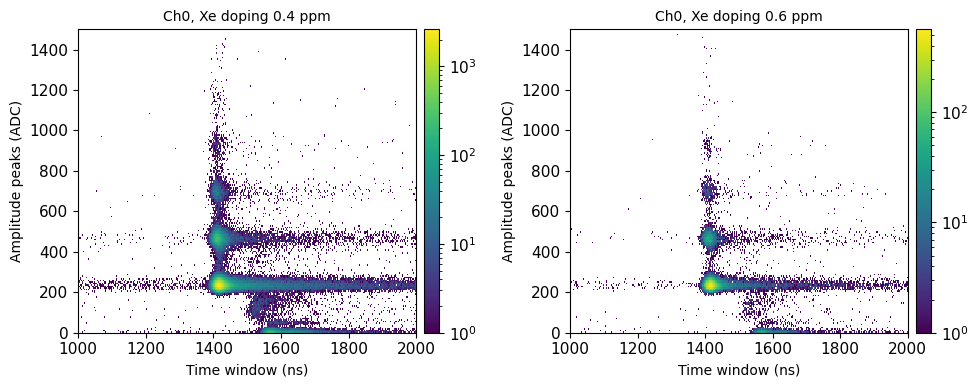

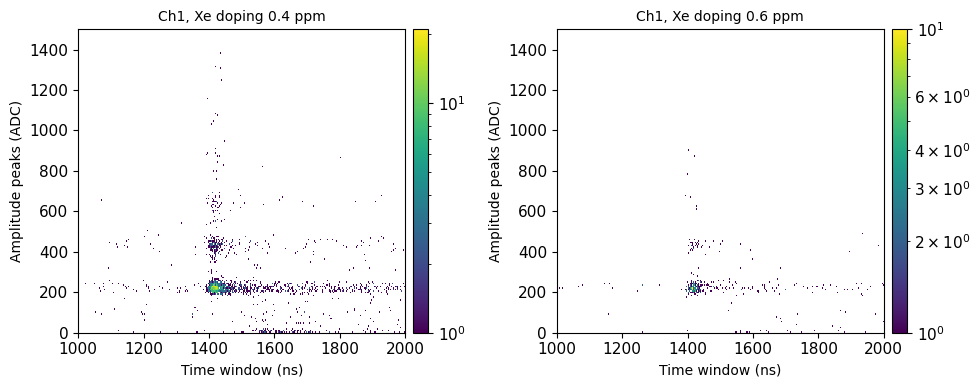

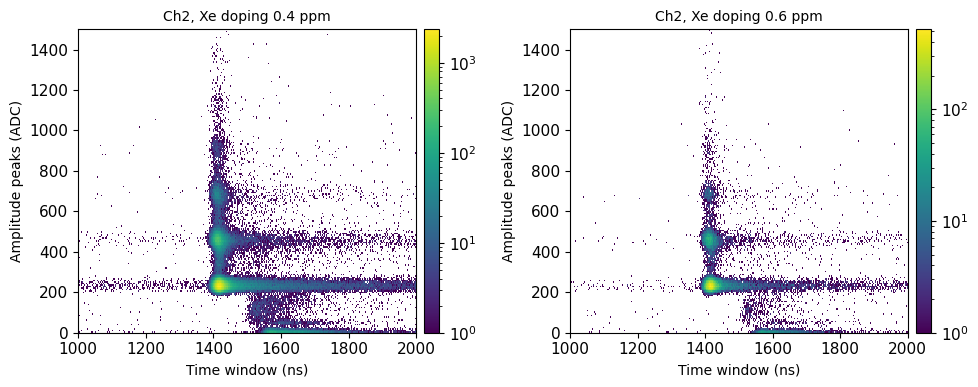

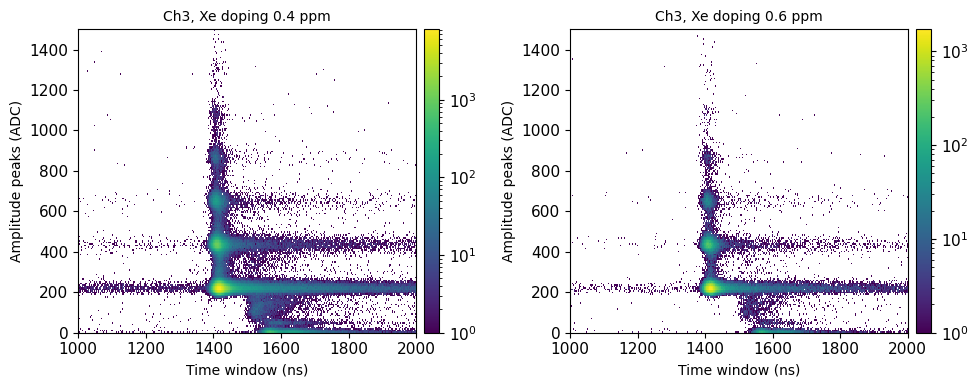

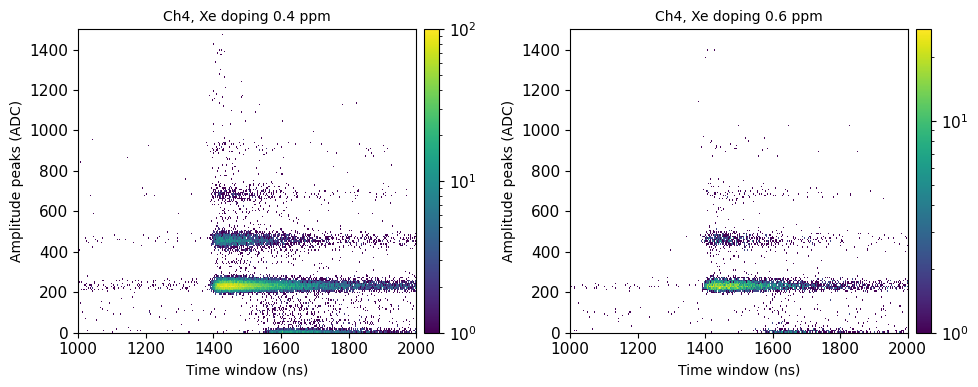

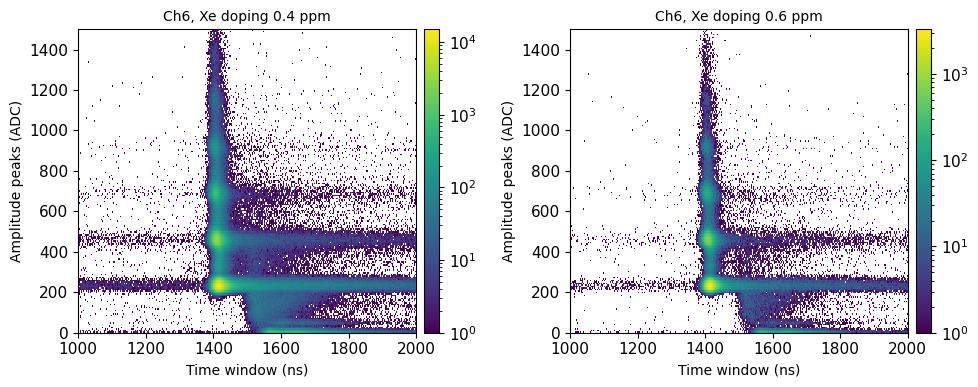

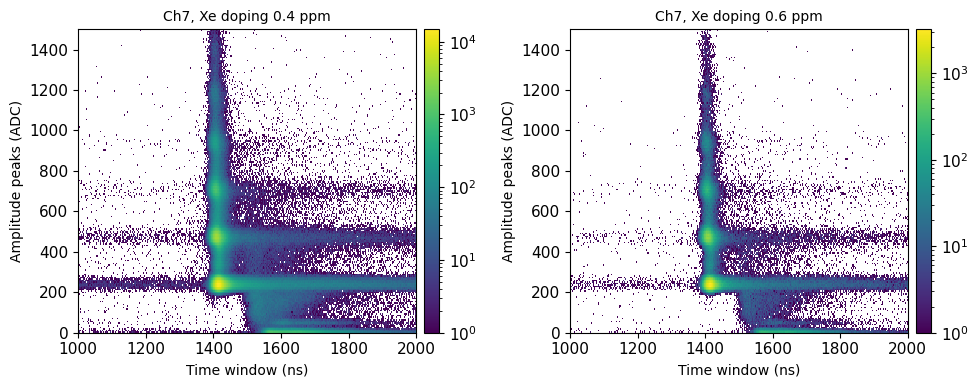

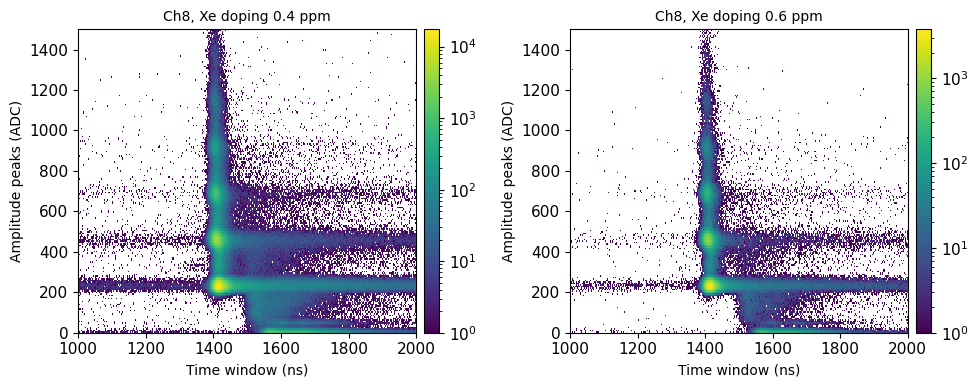

In [41]:
for k in normal_chs:
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))    
    for ax, dates, xe_dop in zip(axs, [dates_xe_4ppm, dates_xe_6ppm[:1]], [0.4, 0.6]):
        ch_idxs = np.concatenate(([idx_peaks_thr_ch_all_xe_dop      [date][k] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_all_xe_dop[date][k] for date in dates]))
        
        fig0 = ax.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 1500)), cmin=1, norm=LogNorm())
        ax.set_xlabel('Time window (ns)',      fontsize=10)
        ax.set_ylabel('Amplitude peaks (ADC)', fontsize=10)
        ax.set_title(f"Ch{k}, Xe doping {xe_dop} ppm",           fontsize=10)
        fig.colorbar(fig0[3], ax=ax, pad=0.02)
    plt.tight_layout()
    plt.show()

In [42]:
filt_evts_all                    = {}
idx_peaks_thr_ch_all             = {}
height_peaks_deconv_ch_all       = {}
idx_peaks_thr_ch_trigg_all       = {}
height_peaks_deconv_ch_trigg_all = {}

normal_chs1 = range(9)
normal_chs2 = [0, 1, 2, 3, 4, 6, 7, 8]

for filename in sorted_files:
    my_file    = evts_path+filename
    d          = np.load(my_file, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date.startswith("11"):
        normal_chs = normal_chs1
        continue
    else:
        normal_chs = normal_chs2
        
        if date not in filt_evts_all:
            print(date)
            filt_evts_all                   [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
            idx_peaks_thr_ch_all            [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']            .item()[ch]) for ch in normal_chs}
            height_peaks_deconv_ch_all      [date] = {ch: np.concatenate(d['height_peaks_deconv_ch_dict']      .item()[ch]) for ch in normal_chs}
    
            idx_peaks_thr_ch_trigg_all      [date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch]) for ch in trigger_chs}
            height_peaks_deconv_ch_trigg_all[date] = {ch: np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
            continue
    
        for ch in normal_chs:
            try:
                filt_evts_all             [date][ch] = np.concatenate((filt_evts_all             [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_peaks_thr_ch_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_all      [date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']      .item()[ch])))
                height_peaks_deconv_ch_all[date][ch] = np.concatenate((height_peaks_deconv_ch_all[date][ch], np.concatenate(d['height_peaks_deconv_ch_dict'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
    
            for ch in trigger_chs:
                idx_peaks_thr_ch_trigg_all      [date][ch] = np.concatenate((idx_peaks_thr_ch_trigg_all      [date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']      .item()[ch])))
                height_peaks_deconv_ch_trigg_all[date][ch] = np.concatenate((height_peaks_deconv_ch_trigg_all[date][ch], np.concatenate(d['height_peaks_deconv_ch_trigg_dict'].item()[ch])))

01_01_2024
01_02_2024
01_04_2024
01_05_2024
01_07_2024
01_09_2024
01_10_2024
01_12_2024
01_15_2024
01_17_2024
01_18_2024
01_19_2024
01_22_2024
01_23_2024
01_25_2024
01_29_2024
12_20_2023
12_21_2023
12_24_2023
12_26_2023
12_28_2023
12_30_2023


In [50]:
dates_xe_4ppm   = ['01_09_2024', '01_10_2024', '01_12_2024', '01_15_2024', '01_17_2024', '01_18_2024',
                   '01_19_2024', '01_22_2024', '01_23_2024', '01_25_2024']
dates_xe_6ppm   = ['01_29_2024', '02_03_2024']
dates_no_doping = [date for date in idx_peaks_thr_ch_trigg_all.keys() if date not in dates_xe_4ppm+dates_xe_6ppm+['12_26_2023']]

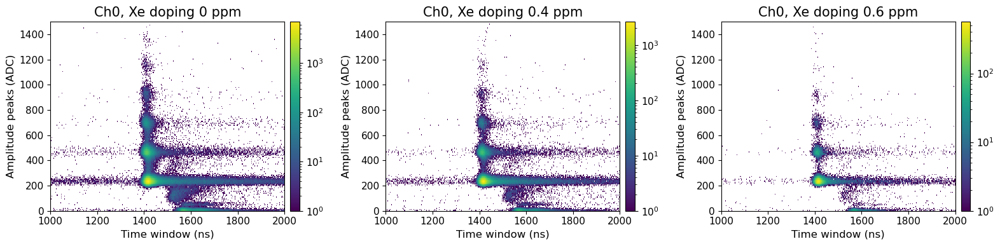

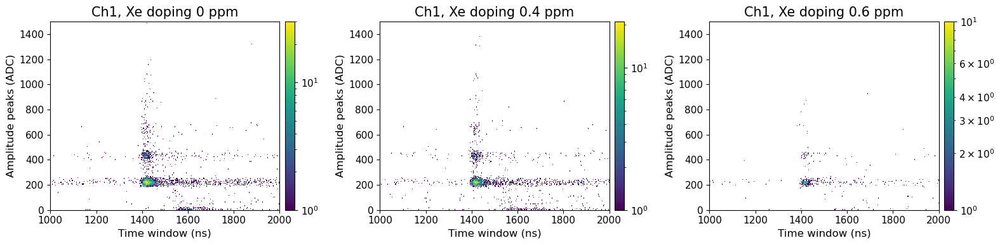

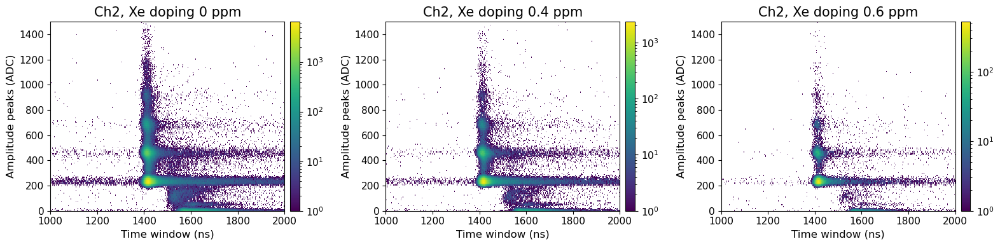

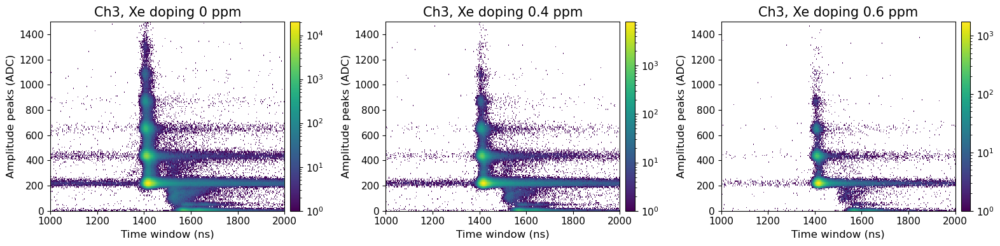

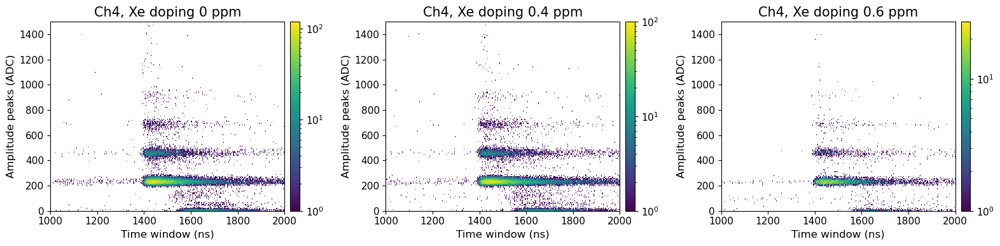

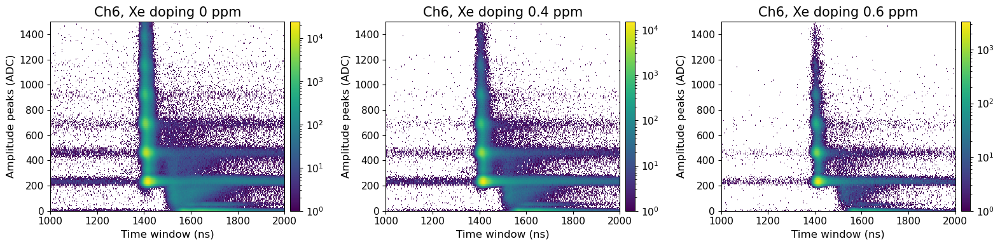

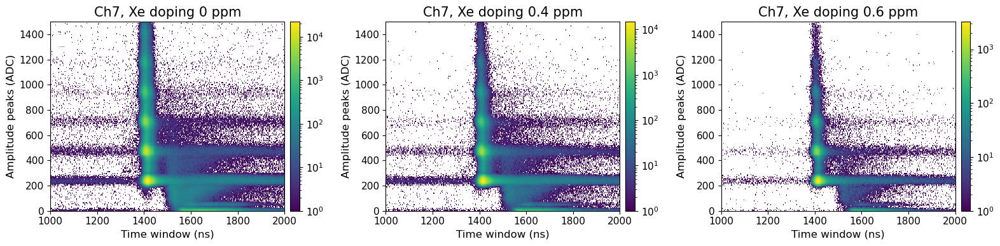

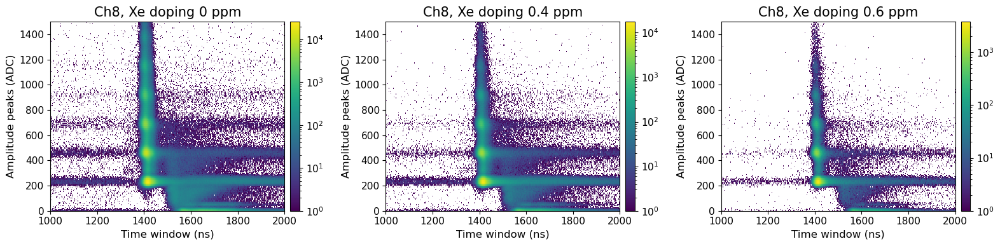

In [57]:
for k in normal_chs:
    fig, axs = plt.subplots(1, 3, figsize=(16, 4))    
    for ax, dates, xe_dop in zip(axs, [dates_no_doping, dates_xe_4ppm, dates_xe_6ppm[:1]], [0, 0.4, 0.6]):
        #for date in dates:
            #print(date, len(idx_peaks_thr_ch_all[date][k]), len(height_peaks_deconv_ch_all[date][k]))
        ch_idxs = np.concatenate(([idx_peaks_thr_ch_all      [date][k] for date in dates]))
        ch_vals = np.concatenate(([height_peaks_deconv_ch_all[date][k] for date in dates]))
        
        fig0 = ax.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 2000), (0, 1500)), cmin=1, norm=LogNorm())
        ax.set_xlabel('Time window (ns)',      fontsize=12)
        ax.set_ylabel('Amplitude peaks (ADC)', fontsize=12)
        ax.set_title(f"Ch{k}, Xe doping {xe_dop} ppm", fontsize=15)
        fig.colorbar(fig0[3], ax=ax, pad=0.02)
    plt.tight_layout()
    plt.show()

## Calibrate:

In [ ]:
filt_evts_all
idx_peaks_ch_all
idx_peaks_thr_ch_all
height_peaks_ch_all
height_peaks_sg_ch_all
height_peaks_deconv_ch_all
idx_peaks_ch_trigg_all
idx_peaks_thr_ch_trigg_all
height_peaks_ch_trigg_all
height_peaks_sg_ch_trigg_all
height_peaks_deconv_ch_trigg_all

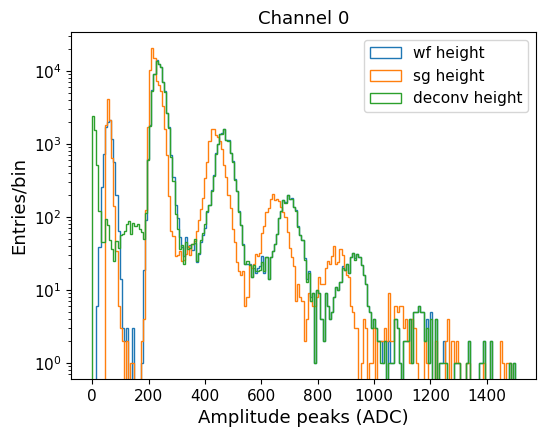

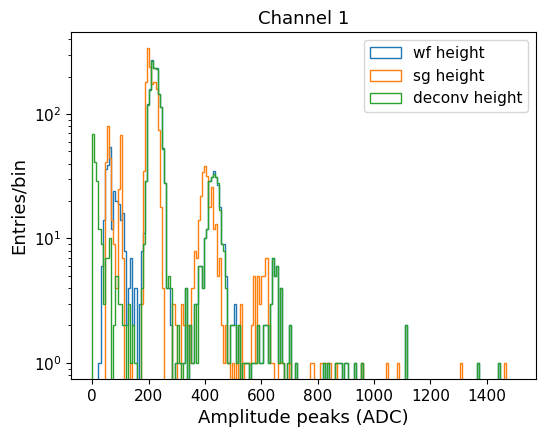

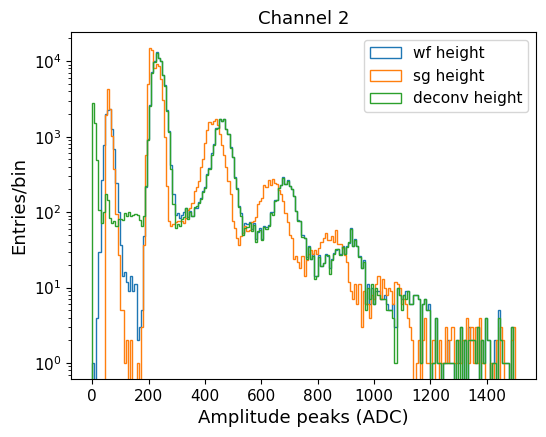

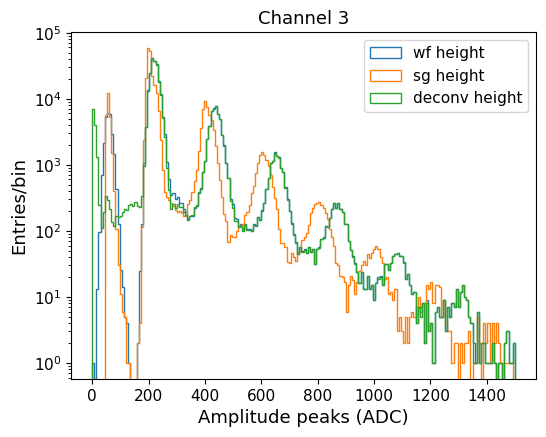

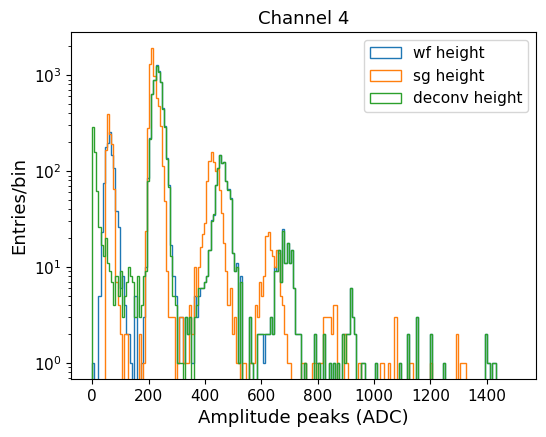

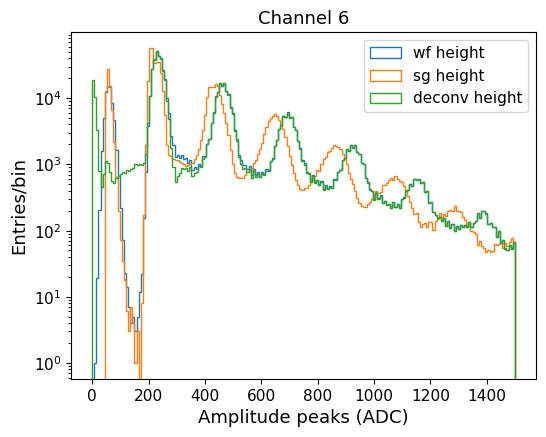

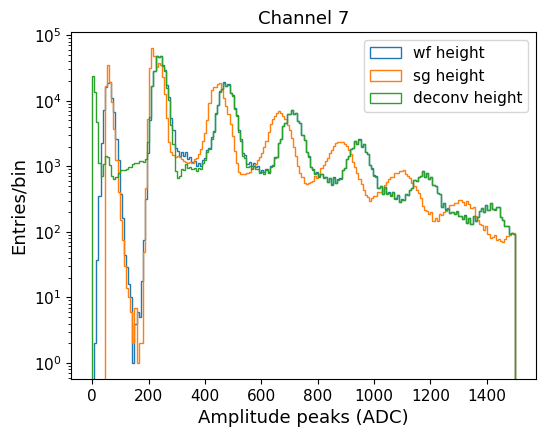

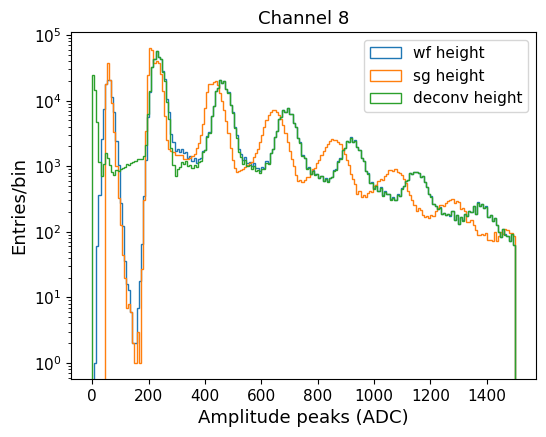

In [13]:
date = '12_28_2023'
for k in normal_chs:
    ch_vals1 = height_peaks_ch_all       [date][k]
    ch_vals2 = height_peaks_sg_ch_all    [date][k]
    ch_vals3 = height_peaks_deconv_ch_all[date][k]
    
    plt.figure(figsize=(6, 4.5))
    for ch_vals, lab in zip([ch_vals1, ch_vals2, ch_vals3], ['wf height', 'sg height', 'deconv height']):
    
        plt.hist(ch_vals, bins=200, range=(0, 1500), label=lab, histtype='step')
    
    plt.ylabel('Entries/bin',           fontsize=13)
    plt.xlabel('Amplitude peaks (ADC)', fontsize=13)
    plt.title(f"Channel {k}",           fontsize=13)
    plt.legend()
    plt.yscale('log')
    plt.show()

In [87]:
import math

from scipy          import stats
from scipy.optimize import curve_fit

# Define the function for a single Gaussian peak
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-(x - mean)**2 / (2 * stddev**2))

# Define the function for multiple Gaussian peaks
def multi_gaussian(x, *params):
    n_peaks = len(params) // 3
    y       = np.zeros_like(x)
    for i in range(n_peaks):
        amplitude = params[i * 3]
        mean      = params[i * 3 + 1]
        stddev    = params[i * 3 + 2]
        y += gaussian(x, amplitude, mean, stddev)
    return y

def shift_to_bin_centers(x):
    """
    Return bin centers, given bin lower edges.
    """
    return x[:-1] + np.diff(x) * 0.5

def truncate(number, decimals=0):
    """
    Returns a value truncated to a specific number of decimal places.
    """
    if not isinstance(decimals, int):
        raise TypeError("decimal places must be an integer.")
    elif decimals < 0:
        raise ValueError("decimal places has to be 0 or more.")
    elif decimals == 0:
        return math.trunc(number)

    factor = 10.0 ** decimals
    return math.trunc(number * factor) / factor

def plot_linear_fit(y, yerr):
    x    = np.arange(len(y))+1
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope*x + intercept
    
    fig = plt.figure(figsize=(8,5))
    plt.errorbar(x, y, yerr=yerr, marker='_', markersize=5, linestyle='', c='k', label=f'Measured gain values')
    plt.plot(x, line, color='r', alpha=0.7, label=f'Fit: y = x*{round(slope, 2)} - {round(np.abs(intercept), 2)}, \n     R$^2$ = {truncate(r_value, 2)}')
    
    plt.xlabel('Peak number')
    plt.ylabel('Mu from fit (ADC)')
    plt.legend(fontsize=14, loc='upper left')
    plt.show()
    return slope

def extract_gain_and_mean(data, channel, bins, prange, initial_guess, nvals=4):
    
    print()
    print('------------------------------------------------------------------------------------------')
    print(f'-------    Channel {channel}    ---------------------------------------------------------')
    print('------------------------------------------------------------------------------------------')
    print()

    plt.figure(figsize=(7, 5))
    y, x, _ = plt.hist(data, bins=bins, range=prange, alpha=0.6, label=f'Channel{channel}')
    plt.xlabel('Amplitude (ADC)', fontsize=15)
    plt.ylabel('Entries/bin',     fontsize=15)
    plt.title(f"Spectrum for channel {channel} (height of the peaks)", fontsize=15)
    plt.show()
    
    popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)
    
    plt.figure(figsize=(7, 5))
    plt.step(shift_to_bin_centers(x), y, label='Spectrum')
    plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
    plt.xlabel('Amplitude (ADC)', fontsize=15)
    plt.ylabel('Entries/bin',     fontsize=15)
    plt.title(f"Channel {channel}",     fontsize=15)
    plt.legend()
    plt.show()
    
    perr         = np.sqrt(np.diag(pcov))    
    means_ch     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
    means_ch_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])
    
    gain_ch = plot_linear_fit(means_ch[:nvals], means_ch_err[:nvals])
    
    return gain_ch, means_ch

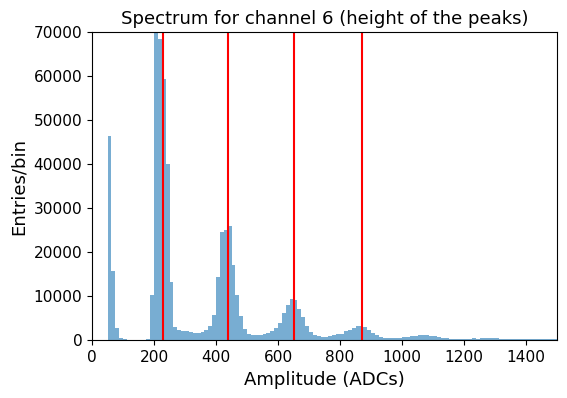

In [51]:
date    = '12_28_2023'
plt.figure(figsize=(6, 4))
ch = 6
y, x, _ = plt.hist(height_peaks_sg_ch_all[date][ch], bins=120, range=(0,1500), log=False, alpha=0.6)
plt.axvline(x=230, color='r')
plt.axvline(x=440, color='r')
plt.axvline(x=650, color='r')
plt.axvline(x=870, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {ch} (height of the peaks)", fontsize=13)
plt.xlim(0, 1500)
plt.ylim(0, 70000)
plt.show()

In [65]:
all_gains = {}
all_means = {}


------------------------------------------------------------------------------------------
-------    Channel 0    ---------------------------------------------------------
------------------------------------------------------------------------------------------



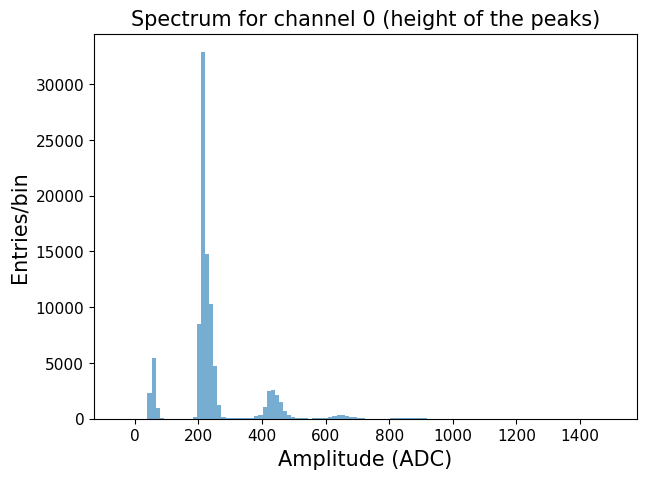

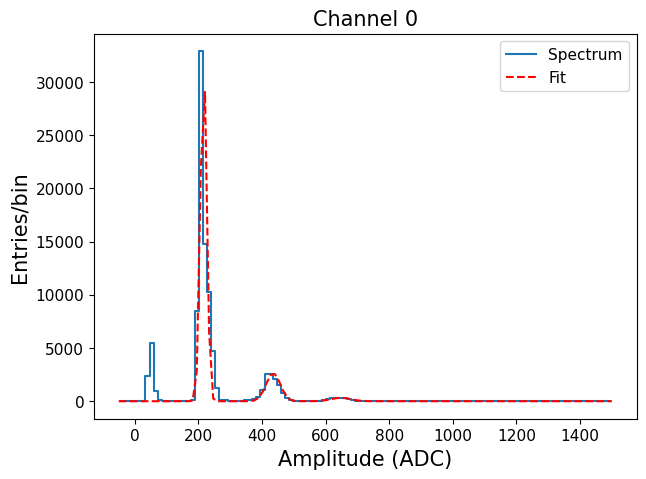

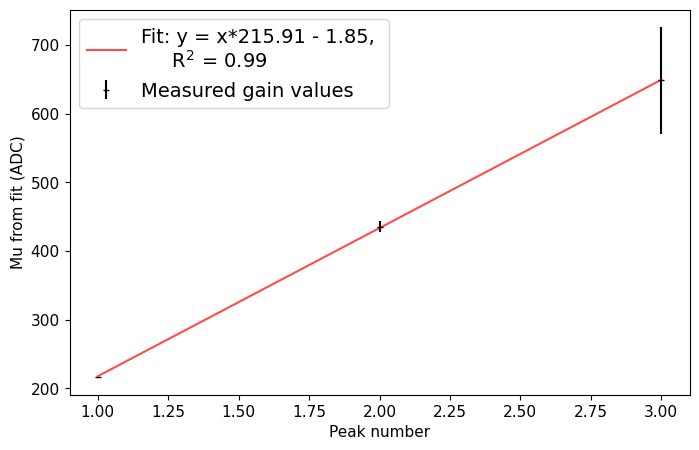


------------------------------------------------------------------------------------------
-------    Channel 1    ---------------------------------------------------------
------------------------------------------------------------------------------------------



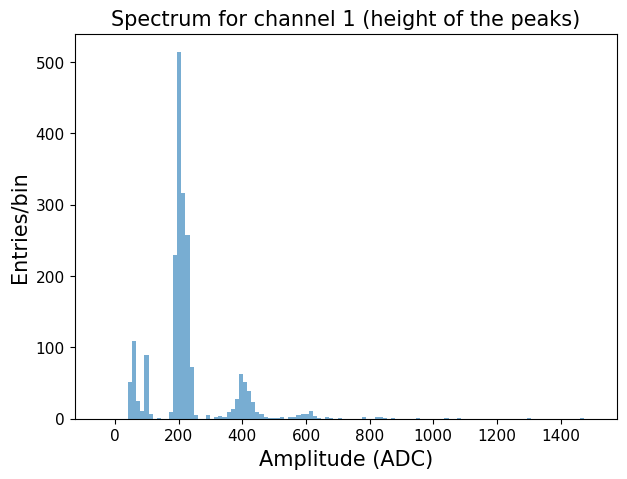

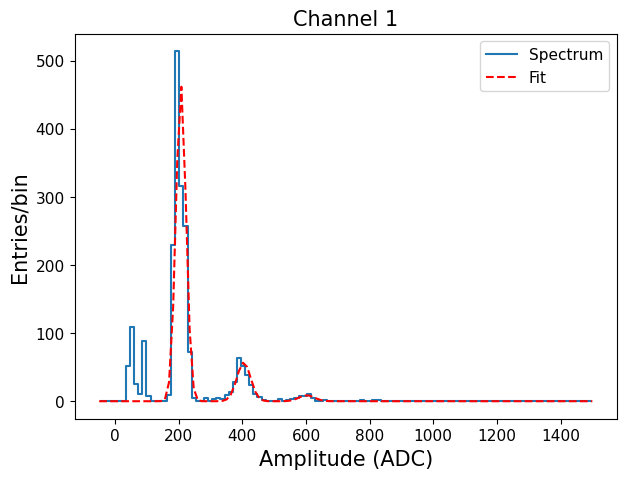

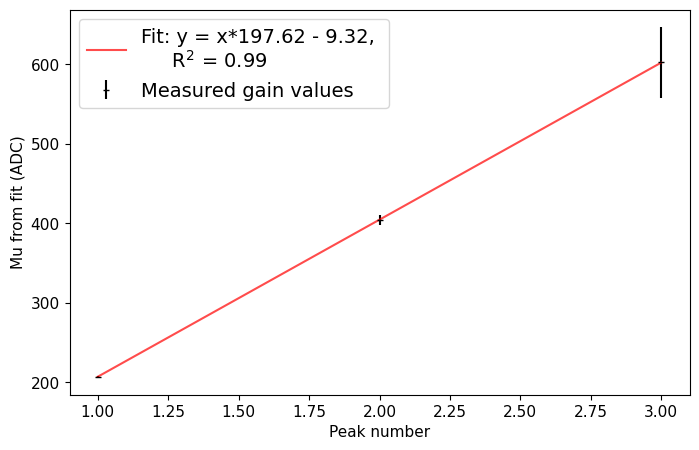


------------------------------------------------------------------------------------------
-------    Channel 2    ---------------------------------------------------------
------------------------------------------------------------------------------------------



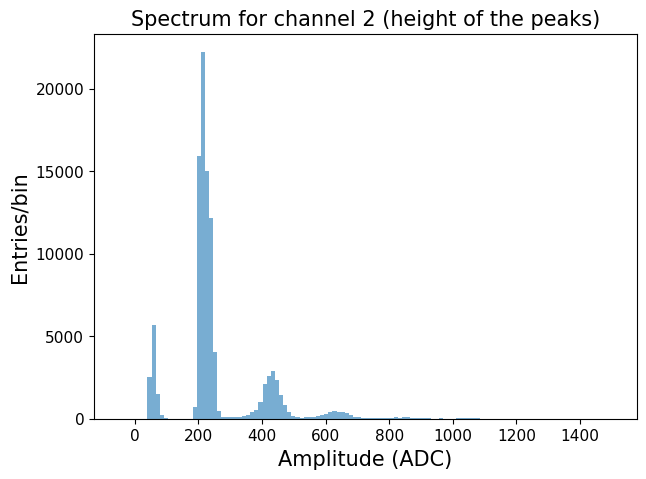

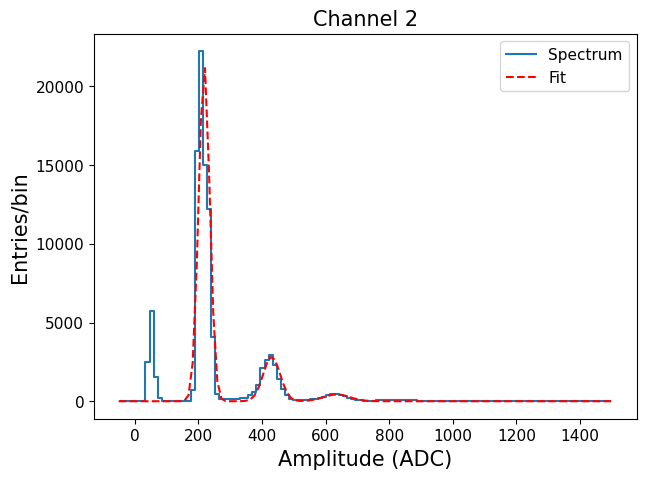

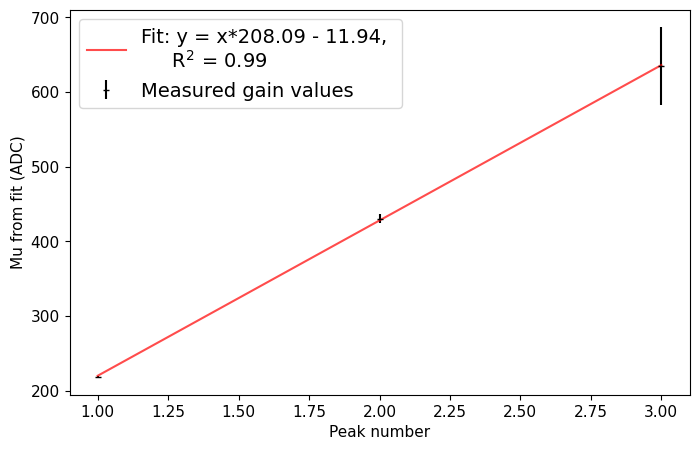


------------------------------------------------------------------------------------------
-------    Channel 3    ---------------------------------------------------------
------------------------------------------------------------------------------------------



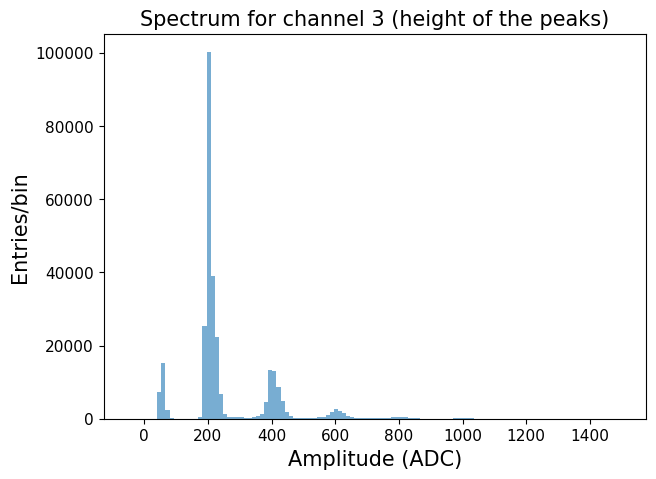

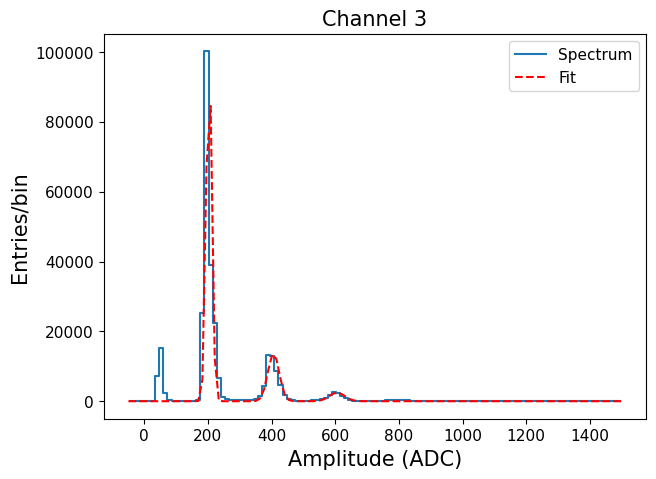

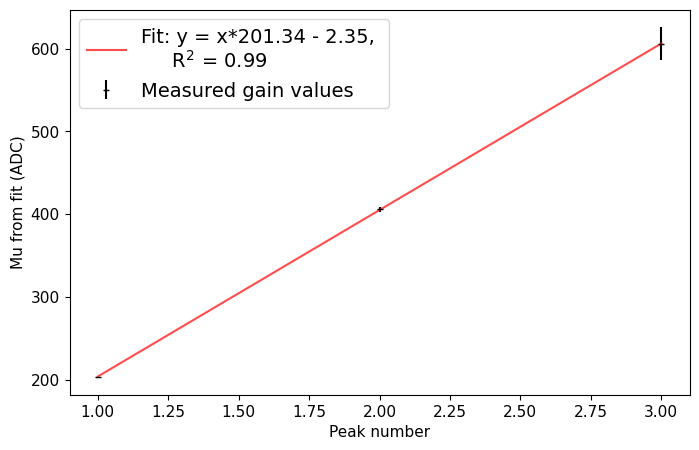


------------------------------------------------------------------------------------------
-------    Channel 4    ---------------------------------------------------------
------------------------------------------------------------------------------------------



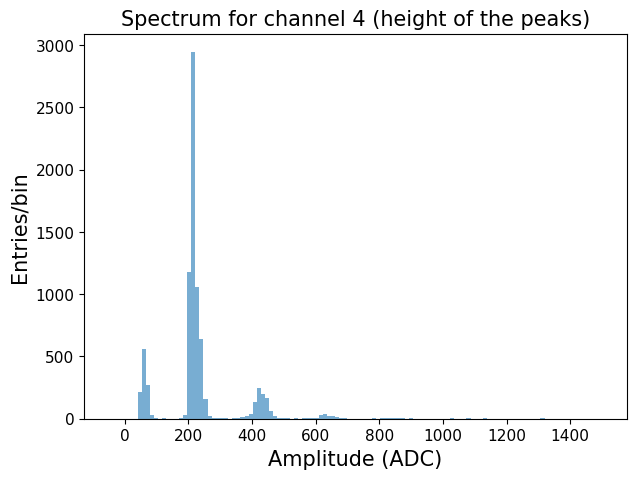

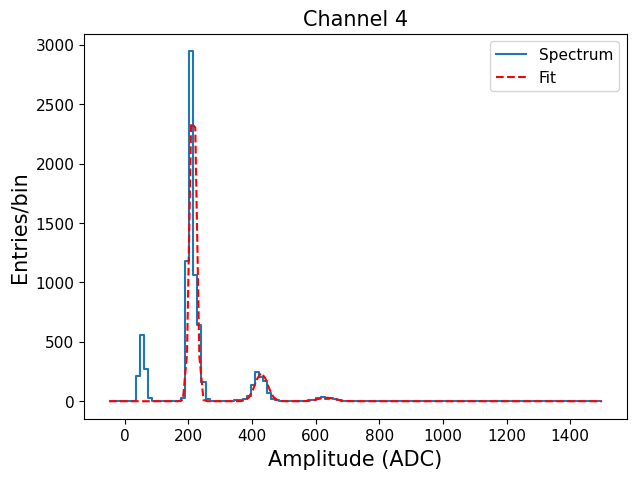

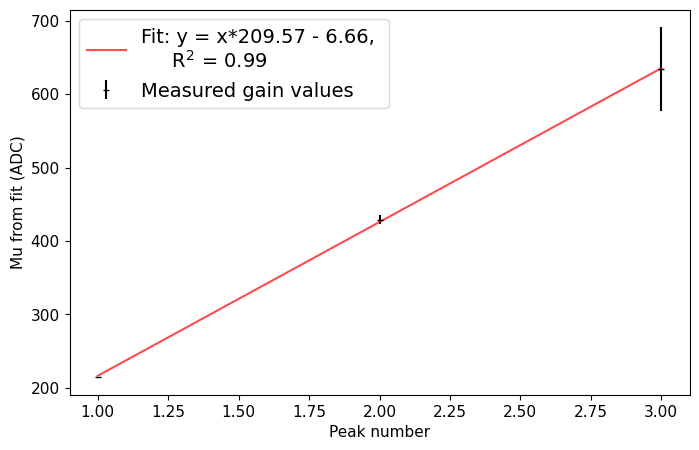


------------------------------------------------------------------------------------------
-------    Channel 6    ---------------------------------------------------------
------------------------------------------------------------------------------------------



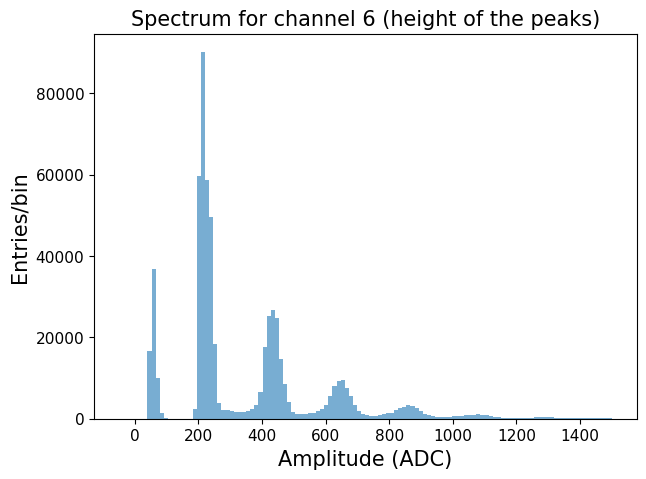

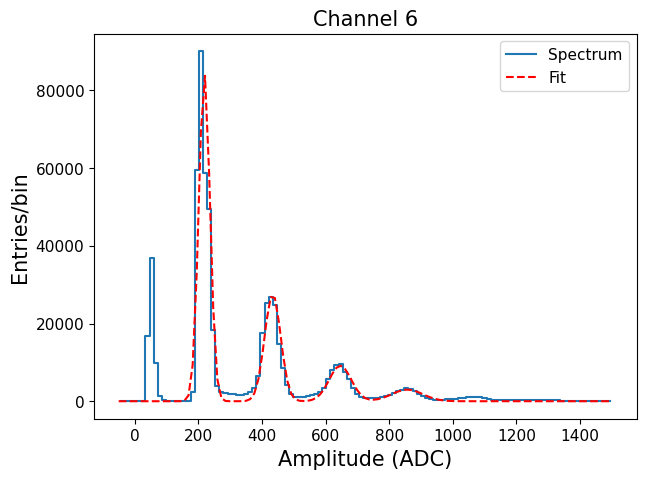

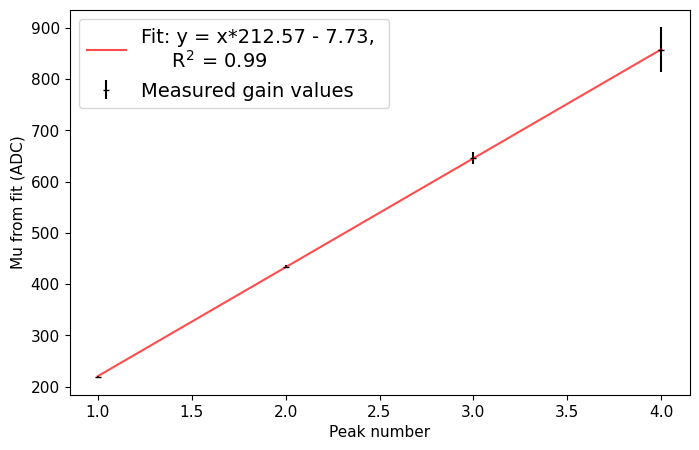


------------------------------------------------------------------------------------------
-------    Channel 7    ---------------------------------------------------------
------------------------------------------------------------------------------------------



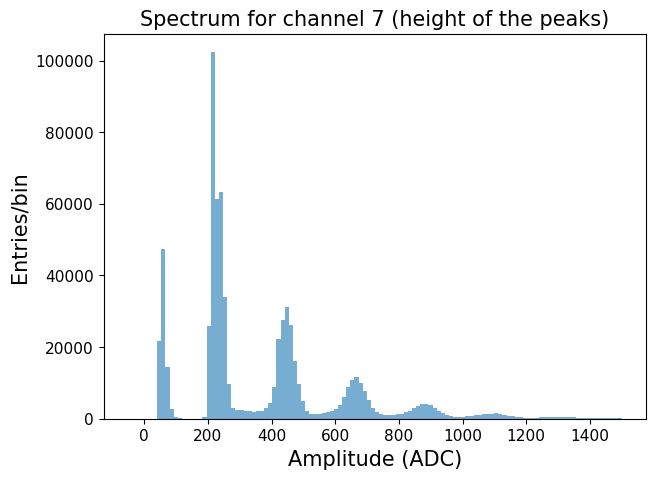

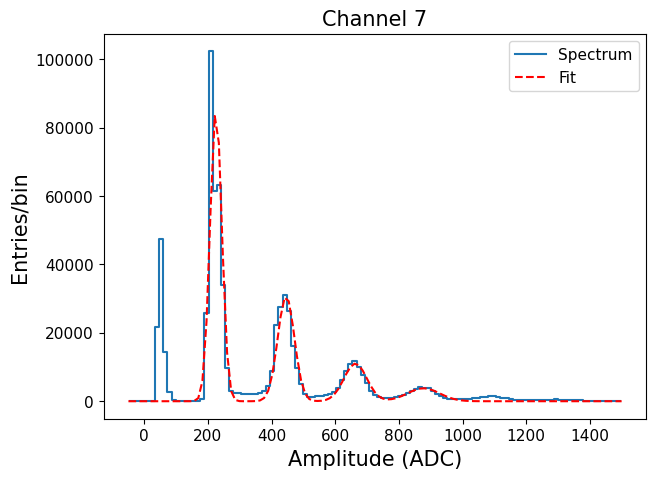

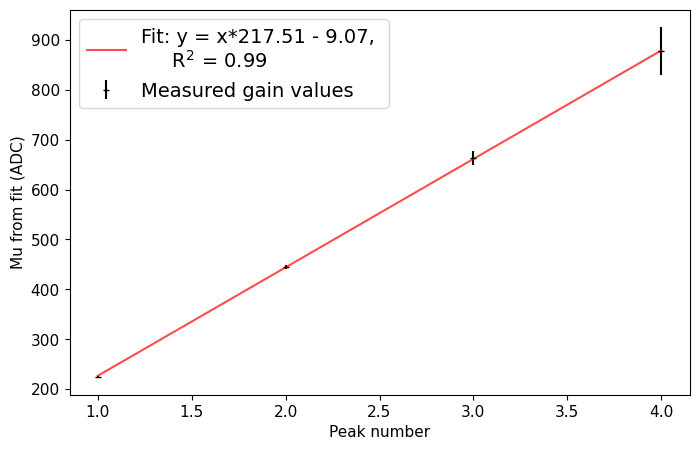


------------------------------------------------------------------------------------------
-------    Channel 8    ---------------------------------------------------------
------------------------------------------------------------------------------------------



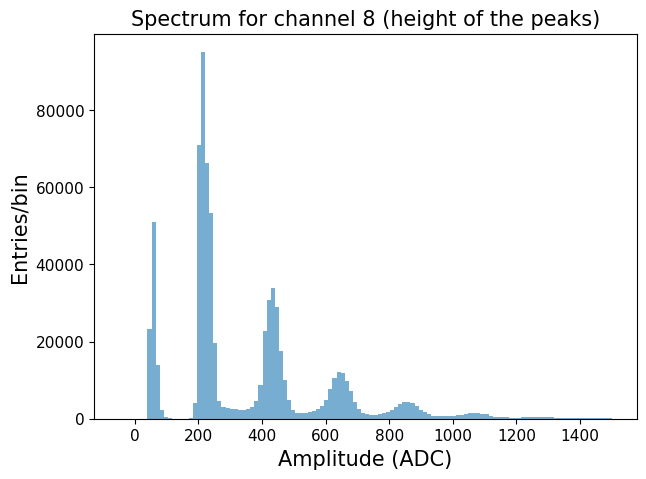

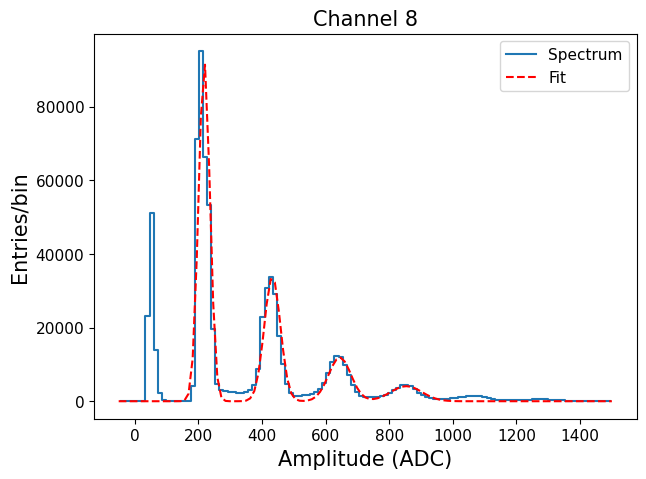

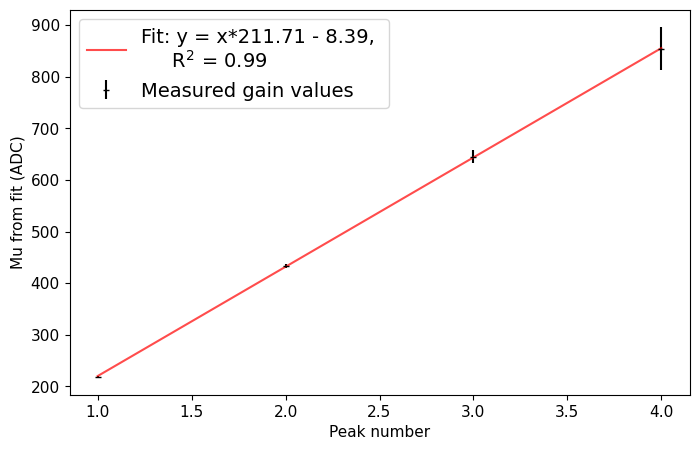

In [66]:
for ch in normal_chs:
    ch_vals2 = height_peaks_sg_ch_all[date][ch]
    if ch < 6:
        initial_guess  = [50000, 230, 15, 4000, 440, 15, 500, 670, 15]
    else:
        initial_guess  = [80000, 230, 15, 25000, 440, 15, 9000, 670, 15, 3000, 870, 15]
    gain, ch_means = extract_gain_and_mean(data          = ch_vals2,
                                           channel       = ch,
                                           bins          = 120,
                                           prange        = (-50, 1500),
                                           initial_guess = initial_guess)
    
    all_gains[ch] = gain
    all_means[ch] = ch_means

#### Trigger SiPMs

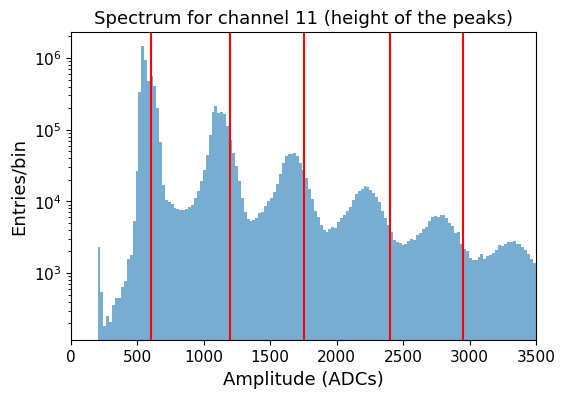

In [102]:
date    = '12_28_2023'
plt.figure(figsize=(6, 4))
ch = 11
y, x, _ = plt.hist(height_peaks_sg_ch_trigg_all[date][ch], bins=150, range=(200,3500), log=True, alpha=0.6)
plt.axvline(x=600, color='r')
plt.axvline(x=1200, color='r')
plt.axvline(x=1750, color='r')
plt.axvline(x=2400, color='r')
plt.axvline(x=2950, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {ch} (height of the peaks)", fontsize=13)
plt.xlim(0, 3500)
#plt.ylim(0, 70000)
plt.show()


------------------------------------------------------------------------------------------
-------    Channel 9    ---------------------------------------------------------
------------------------------------------------------------------------------------------



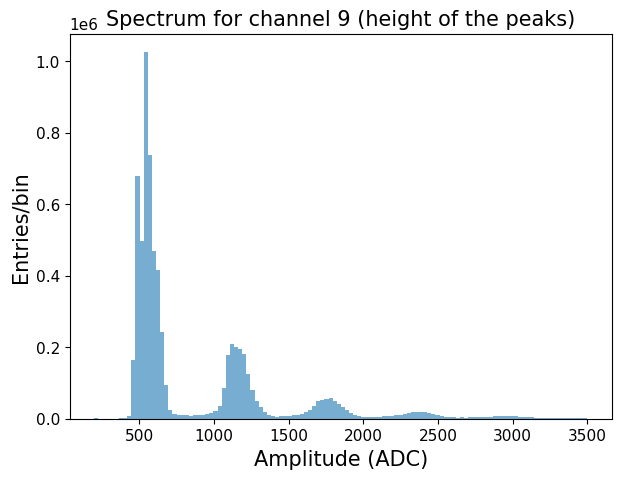

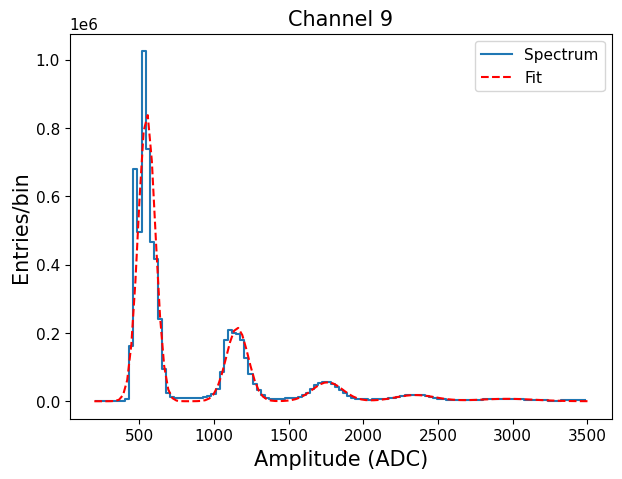

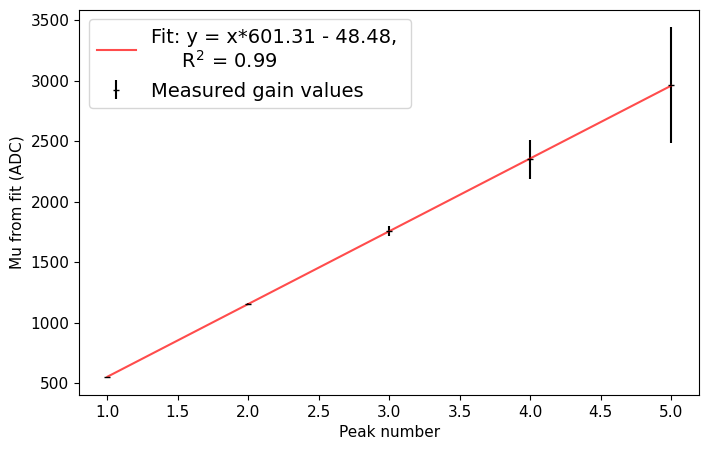


------------------------------------------------------------------------------------------
-------    Channel 10    ---------------------------------------------------------
------------------------------------------------------------------------------------------



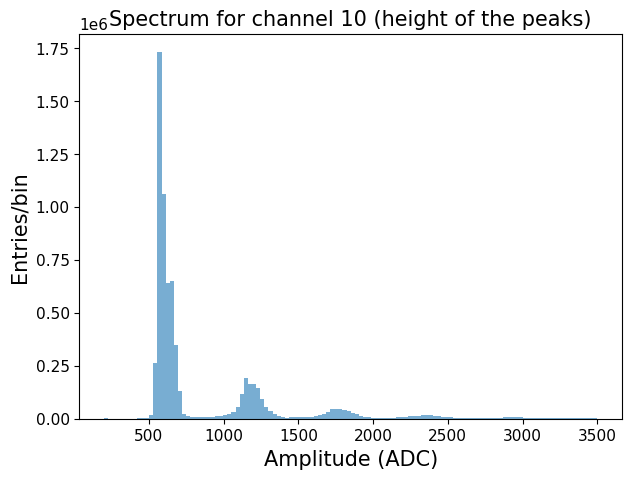

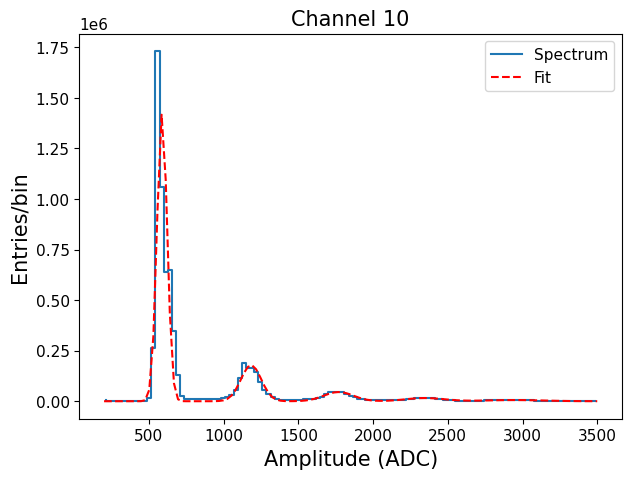

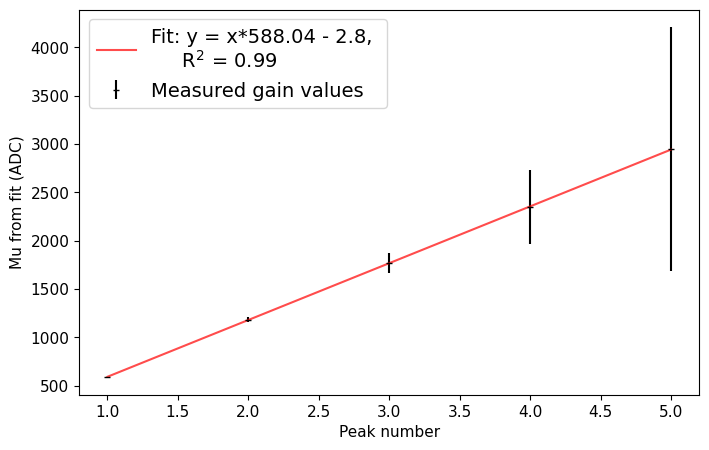


------------------------------------------------------------------------------------------
-------    Channel 11    ---------------------------------------------------------
------------------------------------------------------------------------------------------



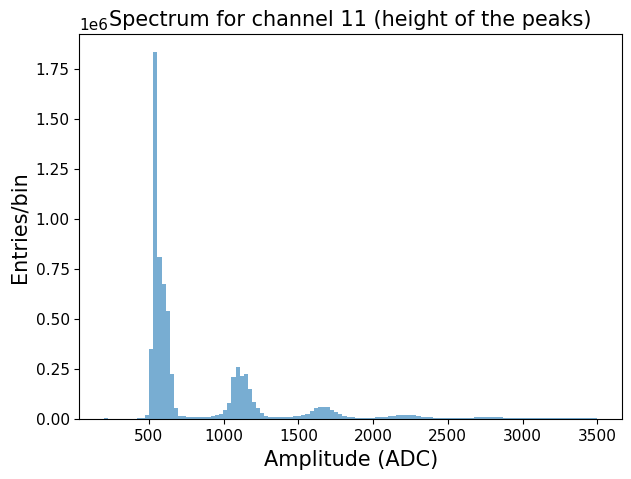

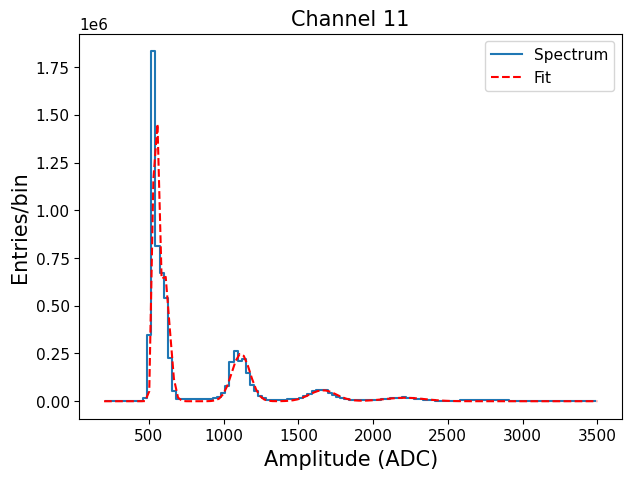

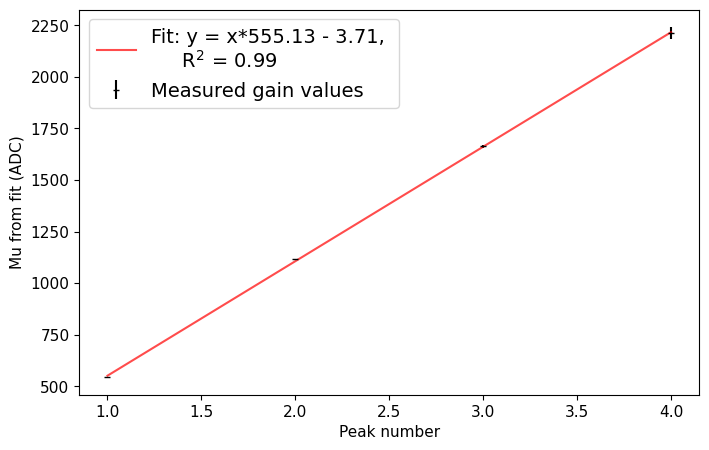

In [104]:
for ch in trigger_chs:
    ch_vals2 = height_peaks_sg_ch_trigg_all[date][ch]
    if ch == 9:
        nvals = 5
        initial_guess = [500000, 550, 15, 200000, 1150, 15, 90000, 1750, 15, 20000, 2400, 15, 10000, 2950, 15]
    elif ch == 10:
        nvals = 5
        initial_guess = [500000, 600, 15, 200000, 1200, 15, 90000, 1750, 15, 20000, 2400, 15, 10000, 2950, 15]
    elif ch == 11:
        nvals = 4
        initial_guess = [500000, 570, 15, 200000, 1150, 15, 90000, 1650, 15, 20000, 2250, 15, 10000, 2750, 15]
    gain, ch_means = extract_gain_and_mean(data          = ch_vals2,
                                           channel       = ch,
                                           bins          = 120,
                                           prange        = (200, 3500),
                                           initial_guess = initial_guess,
                                           nvals         = nvals)
    
    all_gains[ch] = gain
    all_means[ch] = ch_means

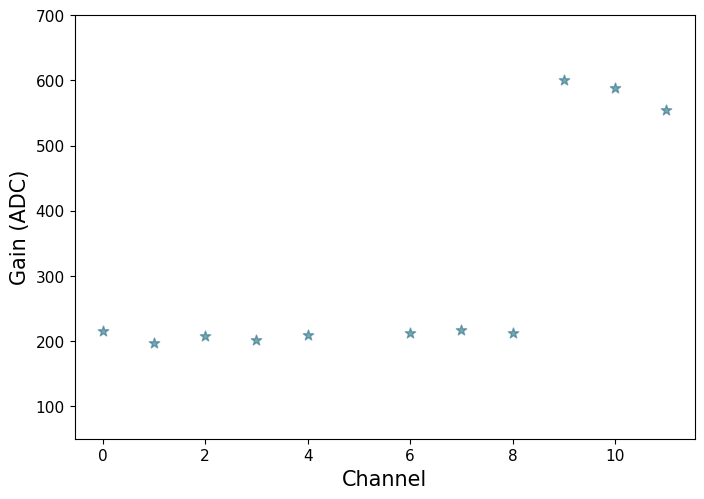

In [110]:
plt.figure(figsize=(8, 5.5))
plt.scatter(all_gains.keys(), all_gains.values(), marker='*', s=60, color='#418094', alpha=0.7)
plt.ylim(50, 700)
plt.ylabel('Gain (ADC)', fontsize=15)
plt.xlabel('Channel',    fontsize=15)
plt.show()

In [111]:
all_gains

{0: 215.9136058765189,
 1: 197.6173531487562,
 2: 208.09116790825274,
 3: 201.34467649924105,
 4: 209.56593611368697,
 6: 212.5709132476739,
 7: 217.5102713630135,
 8: 211.7111175113524,
 9: 601.3149156238308,
 10: 588.0378833443852,
 11: 555.1266908913976}